# Разработка модели для предсказания продолжения деятельности стартапов.

## Исходные данные по проекту и импорт библиотек.

### Цели и задачи проекта. Описание исходных данных.

**Цель проекта**: \
Выявить факторы, влияющие на успешность стартапа.

**Задачи проекта**:
1. Разработать модель машинного обучения для предсказания продолжения деятельности стартапов.
2. Провести полноценный разведочный анализ и сформировать рекомендации будущим создателям стартапов (какие факторы влияют на успешность стартапа)

Для решения поставленных задач потребуется провести следующие этапы работ:
1. Изучим полученные исходные данные. Определим их полноту и корректность формата.
2. Проведем предобработку данных - проверим исходные данные на наличие пропусков и дубликатов.
3. Проведем исследовательский и корреляционный анализы признаков датасетов.
4. Подготовим датасет для обучения модели предсказания продолжения деятельности стартапов.
5. Обучим несколько моделей для предсказания удовлетворенности и подберем для них гиперпараметры при помощи пайплайна.
6. Подберем подходящую метрику и выберем на ее основании лучшую модель для решения задачи.
7. Проведем анализ полученных результатов, подготовим вывод исследования и рекомендации по проекту.

Исходные данные содержат информацию о стартапах, которые функционировали в период с 1970 по 2017 годы. Дата формирования выгрузки: 2018-01-01.\
Целевой признак датасета: *status*, указывающий на то, закрылся стартап или продолжает действовать (operating / closed).

**kaggle_startups_train_28062024.csv** - информация о стартапах, которые будут использоваться в качестве обучающих данных. \
**kaggle_startups_test_28062024.csv** - информация о стартапах, которые будут использоваться в качестве тестовых данных.


### Импорт необходимых библиотек.

In [272]:
!pip install -U scikit-learn
!pip install -q phik
!pip install -q shap

In [273]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
import phik
import shap
import warnings
import requests
from phik.report import plot_correlation_matrix
from sklearn.model_selection import train_test_split, cross_val_score, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, MinMaxScaler, OneHotEncoder, OrdinalEncoder, LabelEncoder
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import roc_auc_score, accuracy_score, recall_score, precision_score, r2_score
from sklearn.pipeline import Pipeline
from sklearn.compose import ColumnTransformer
from sklearn.impute import SimpleImputer
from sklearn.inspection import permutation_importance
from io import BytesIO
# импортируем необходимые для проекта библиотеки

pd.set_option('max_rows', None)
pd.set_option('max_columns', None)
pd.set_option('display.max_colwidth', None)
pd.options.display.float_format ='{:,.2f}'.format
warnings.filterwarnings('ignore')
# настраиваем вывод таблиц в полном объеме и скрываем предупреждения.

In [274]:
RANDOM_STATE = 42
TEST_SIZE = 0.25
# определяем RANDOM_STATE и TEST_SIZE для обучения моделей

### Загрузка датасетов.

In [275]:
train_id = '1QwiVJ08nYevm7LRgbvSF7hOSe3W-2-rp9D_16YsXxqA'
file_train = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(train_id)
r = requests.get(file_train)
startup_data = pd.read_csv(BytesIO(r.content))
startup_data.head()
# загружаем датасет с основными данными тренировочной выборки и смотрим первык 5 строк

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,NaN
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,NaN
2,Reviva Pharmaceuticals,Biotechnology,"35,456,381.00",operating,USA,CA,SF Bay Area,San Jose,3,2006-01-01,2012-08-20,2014-07-02,NaN
3,Sancilio and Company,Health Care,"22,250,000.00",operating,NaN,NaN,NaN,NaN,3,2004-01-01,2011-09-01,2014-07-18,NaN
4,WireTough Cylinders,Manufacturing,NaN,operating,USA,VA,VA - Other,Bristol,1,2010-05-12,2012-02-01,2012-02-01,NaN


In [276]:
test_id = '1YBsjLsmwEv65XgCZhvTXk-dzbCWArLEPuk7wquGbcnI'
file_test = 'https://docs.google.com/spreadsheets/d/{}/export?format=csv'.format(test_id)
t = requests.get(file_test)
startup_test = pd.read_csv(BytesIO(t.content))
startup_test.head()
# загружаем датасет с основными данными тестовой выборки и смотрим первык 5 строк

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717
2,COINPLUS,Finance,"428,257.00",LUX,3,Esch-sur-alzette,Esch-sur-alzette,2,2014-05-15,2014-09-18,1295
3,Imagine Communications,Software|Video|Video Streaming,"34,700,000.00",USA,CA,San Diego,San Diego,4,2005-01-01,2010-04-20,4748
4,DNA13,Software,"4,530,000.00",CAN,ON,Ottawa,Ottawa,1,2007-05-08,2007-05-08,6209


### Изучение общей информации о данных.

In [277]:
startup_data.info()
# смотрим общую информацию по датасету

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               52515 non-null  object 
 1   category_list      50051 non-null  object 
 2   funding_total_usd  42447 non-null  float64
 3   status             52516 non-null  object 
 4   country_code       47014 non-null  object 
 5   state_code         45753 non-null  object 
 6   region             46157 non-null  object 
 7   city               46157 non-null  object 
 8   funding_rounds     52516 non-null  int64  
 9   founded_at         52516 non-null  object 
 10  first_funding_at   52516 non-null  object 
 11  last_funding_at    52516 non-null  object 
 12  closed_at          4917 non-null   object 
dtypes: float64(1), int64(1), object(11)
memory usage: 5.2+ MB


In [278]:
startup_data.describe()
# смотрим основные числовые характеристики датасета

,funding_total_usd,funding_rounds
count,"42,447.00","52,516.00"
mean,"18,247,480.66",1.74
std,"187,117,301.32",1.37
min,1.00,1.00
25%,"336,027.50",1.00
50%,"2,000,000.00",1.00
75%,"10,000,000.00",2.00
max,"30,079,503,000.00",19.00


In [279]:
startup_test.info()
# смотрим общую информацию по датасету

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               13125 non-null  object 
 1   category_list      12534 non-null  object 
 2   funding_total_usd  10547 non-null  float64
 3   country_code       11743 non-null  object 
 4   state_code         11430 non-null  object 
 5   region             11536 non-null  object 
 6   city               11538 non-null  object 
 7   funding_rounds     13125 non-null  int64  
 8   first_funding_at   13125 non-null  object 
 9   last_funding_at    13125 non-null  object 
 10  lifetime           13125 non-null  int64  
dtypes: float64(1), int64(2), object(8)
memory usage: 1.1+ MB


In [280]:
startup_test.describe()
# смотрим основные числовые характеристики датасета

,funding_total_usd,funding_rounds,lifetime
count,"10,547.00","13,125.00","13,125.00"
mean,"16,549,102.70",1.71,"3,097.61"
std,"92,172,825.63",1.32,"2,128.36"
min,1.00,1.00,52.00
25%,"320,000.00",1.00,"1,726.00"
50%,"2,000,000.00",1.00,"2,526.00"
75%,"10,000,000.00",2.00,"3,866.00"
max,"4,715,000,000.00",15.00,"17,167.00"


**Вывод по предварительному анализу данных**: \
Загружены две таблицы с данными - тренировочная и тестовая выборки по стартапам. Таблицы содержат в себе информацию по компаниям. Тренировочная выборка также содержит целевой признак, который мы будем предсказывать - status. Обратим внимание, что набор признаков в тренировочной и тестовой выборке отличается: в датасете startup_data данные о времени работы компании представлены в виде двух признаков в формате дат *founded_at* и *closed_at* (дата основания и дата закрытия соответственно). А в тренировочной выборке эта характеристика представлена в виде числа *lifetime*, вероятнее всего являющегося количеством дней работы компании. Во время предварительной обработки приведем тренировочный датасет к формату тестового.

В датасете startup_data 52516 записей. Во многих столбцах есть пропуски, больше всего их *closed_at*. Тип данных в ячейках тоже не совсем корректен (даты представлены в виде простой строки). Числовые характеристики *funding_total_usd* и *funding_rounds* имеют аномально высокие значения, нужно будет изучить их подробнее.

В датасете startup_test 13125 записей. Тут также большое количество пропусков в данных, неверный тип данных в датах. Числовые характеристики *funding_total_usd*, *funding_rounds* и *lifetime* также имеют аномально высокие значения.

##  Предобработка данных.

In [281]:
startup_data_temp = startup_data.copy()
startup_test_temp = startup_test.copy()
print(len(startup_data_temp), len(startup_test_temp))
# создаем копию датафреймов до преобразования и фиксируем, сколько строк было изначально.

52516 13125


### Изменение типов данных.

На первом этапе мы выяснили, что данные в признаках founded_at, first_funding_at, last_funding_at и closed_at имеют формат строки, хотя содержат в себе дату. Проведем преобразование.

In [282]:
incorrect_type = ['founded_at', 'first_funding_at', 'last_funding_at', 'closed_at']
# создаем список из столбцов с неверным типом данных в тренировочной выборке
for x in incorrect_type:
    startup_data[x] = pd.to_datetime(startup_data[x], format='%Y-%m-%dT%H:%M:%S')
incorrect_type_2 = ['first_funding_at', 'last_funding_at']
# создаем список из столбцов с неверным типом данных в тестовой выборке
for x in incorrect_type_2:
    startup_test[x] = pd.to_datetime(startup_test[x], format='%Y-%m-%dT%H:%M:%S')
    
# Переводим даты  из формата строки (object) в формат даты (datetime)

In [283]:
startup_data.info()
# проверяем

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 52516 entries, 0 to 52515
Data columns (total 13 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               52515 non-null  object        
 1   category_list      50051 non-null  object        
 2   funding_total_usd  42447 non-null  float64       
 3   status             52516 non-null  object        
 4   country_code       47014 non-null  object        
 5   state_code         45753 non-null  object        
 6   region             46157 non-null  object        
 7   city               46157 non-null  object        
 8   funding_rounds     52516 non-null  int64         
 9   founded_at         52516 non-null  datetime64[ns]
 10  first_funding_at   52516 non-null  datetime64[ns]
 11  last_funding_at    52516 non-null  datetime64[ns]
 12  closed_at          4917 non-null   datetime64[ns]
dtypes: datetime64[ns](4), float64(1), int64(1), object(7)
memory 

In [284]:
startup_test.info()
# проверяем

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13125 entries, 0 to 13124
Data columns (total 11 columns):
 #   Column             Non-Null Count  Dtype         
---  ------             --------------  -----         
 0   name               13125 non-null  object        
 1   category_list      12534 non-null  object        
 2   funding_total_usd  10547 non-null  float64       
 3   country_code       11743 non-null  object        
 4   state_code         11430 non-null  object        
 5   region             11536 non-null  object        
 6   city               11538 non-null  object        
 7   funding_rounds     13125 non-null  int64         
 8   first_funding_at   13125 non-null  datetime64[ns]
 9   last_funding_at    13125 non-null  datetime64[ns]
 10  lifetime           13125 non-null  int64         
dtypes: datetime64[ns](2), float64(1), int64(2), object(6)
memory usage: 1.1+ MB


### Анализ пропусков.

In [285]:
def check_nan(data):
    """Эта функция считает количество пропусков в датасете и выводит соответствующее сообщение.

    В качестве аргумента передается название датасета. Функция по всем столбцам проведет подсчет пропусков и выведет
    их количество в сообщении. Если они есть, выводятся также названия столбцов с пропуском и строки датасета с ними"""
    nan_sum = 0
    for i in data:
        nan_sum += data[i].isna().sum()
    if nan_sum == 0:
        return print(f'Пропусков в датасете не обнаружено.')
    else:
        print(f'Обнаружены пропуски в датасете в количестве {nan_sum}. Требуется изучить данные подробнее.')
        nan_columns = []
        for j in data:
            if data[j].isna().sum() > 0:
                nan_columns.append(j)
        print(f'Обнаружены пропуски в столбцах {nan_columns}. Пример строк с пропусками:')
        return data.loc[(data.isna().any(axis=1))].head()
# Пишем функцию подсчета и проверки пропусков в датафрейме

In [286]:
def pass_value_barh(data):
    """Эта функция строит график с долей пропусков в параметрах.

    В качестве аргумента передается название датасета. Функция по всем столбцам проведет подсчет пропусков и выведет
    гистограмму с параметрами, в которых есть пропуски. Гистограмма отражает долю пропусков."""
    try:
        (
            (data.isna().mean()*100)
            .to_frame()
            .rename(columns = {0:'space'})
            .query('space > 0')
            .sort_values(by = 'space', ascending = True)
            .plot(kind = 'barh', figsize = (19,6), legend = False, fontsize = 16)
            .set_title('Доля пропусков в данных, %' + "\n", fontsize = 22, color = 'SteelBlue')
        )
        plt.xlim(0, 100)
        plt.show();    
    except:
        print(f'Пропусков в датасете не обнаружено.')
# Пишем функцию для визуализации доли пропусков в датасете

In [287]:
dataframes = {
    'startup_data': startup_data,
    'startup_test': startup_test
}
# создаем словарь с названиями датафреймов
for name, df in dataframes.items():
    print(f'Датасет {name}:')
    display(check_nan(df))
# Применяем функции ко всем датасетам

Датасет startup_data:
Обнаружены пропуски в датасете в количестве 85117. Требуется изучить данные подробнее.
Обнаружены пропуски в столбцах ['name', 'category_list', 'funding_total_usd', 'country_code', 'state_code', 'region', 'city', 'closed_at']. Пример строк с пропусками:


,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,NaT
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,NaT
2,Reviva Pharmaceuticals,Biotechnology,"35,456,381.00",operating,USA,CA,SF Bay Area,San Jose,3,2006-01-01,2012-08-20,2014-07-02,NaT
3,Sancilio and Company,Health Care,"22,250,000.00",operating,NaN,NaN,NaN,NaN,3,2004-01-01,2011-09-01,2014-07-18,NaT
4,WireTough Cylinders,Manufacturing,NaN,operating,USA,VA,VA - Other,Bristol,1,2010-05-12,2012-02-01,2012-02-01,NaT


Датасет startup_test:
Обнаружены пропуски в датасете в количестве 9422. Требуется изучить данные подробнее.
Обнаружены пропуски в столбцах ['category_list', 'funding_total_usd', 'country_code', 'state_code', 'region', 'city']. Пример строк с пропусками:


,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717
5,Quickfire Games,Design|Entertainment|Games,"160,000.00",NaN,NaN,NaN,NaN,2,2013-09-18,2014-09-18,1583
7,Triosyn,Health Care|Medical|Therapeutics,"4,000,000.00",NaN,NaN,NaN,NaN,1,2003-06-02,2003-06-02,5576
10,Omega Discovery Solutions,Consulting|Enterprises,NaN,USA,AZ,Phoenix,Phoenix,1,2014-12-06,2014-12-06,1660


Датасет startup_data:


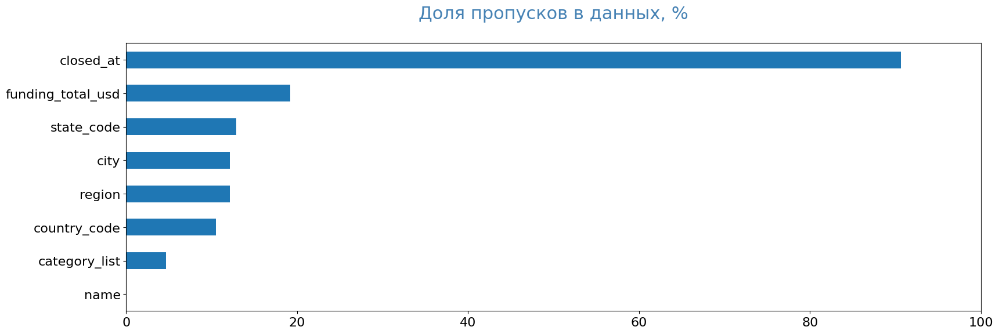

Датасет startup_test:


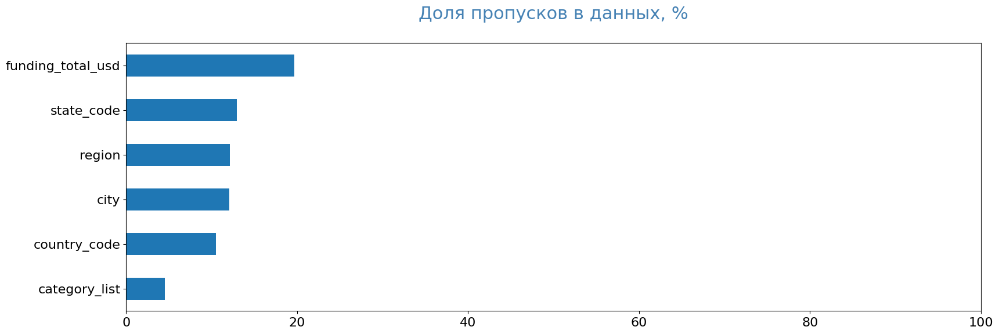

In [288]:
for name, df in dataframes.items():
    print(f'Датасет {name}:')
    pass_value_barh(df)
# Применяем функции ко всем датасетам

In [289]:
startup_data.isna().sum()

name                     1
category_list         2465
funding_total_usd    10069
status                   0
country_code          5502
state_code            6763
region                6359
city                  6359
funding_rounds           0
founded_at               0
first_funding_at         0
last_funding_at          0
closed_at            47599
dtype: int64

In [290]:
startup_test.isna().sum()

name                    0
category_list         591
funding_total_usd    2578
country_code         1382
state_code           1695
region               1589
city                 1587
funding_rounds          0
first_funding_at        0
last_funding_at         0
lifetime                0
dtype: int64

Первичный анализ показывает большое количество пропусков в признаке closed_at. Это можно объяснить тем, что компании из датасета еще не закрылись. Проверим эту теорию:

In [291]:
startup_data.query('(closed_at.isna()) & (status == "closed")').head()
# смотрим, есть ли в датасете записи с пропуском в closed_at, но статусом closed

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at


Как видим, теория подтверждается. В датасете нет записей с пустой датой закрытия, имеющих статус "closed". \
Поскольку в дальнейшем мы будем превращать признаки closed_at и founded_at в признак lifetime, то мы можем заполнить пропуски в closed_at датой предоставления датасетов - 2018-01-01.
Таким образом, мы можем заполнить это значение.

In [292]:
startup_data['closed_at'] = startup_data['closed_at'].fillna('2018-01-01')
startup_data['closed_at'] = pd.to_datetime(startup_data['closed_at'], format='%Y-%m-%dT%H:%M:%S')
# Присвоим пропускам в closed_at значение '2018-01-01'

In [293]:
startup_data['closed_at'].isna().sum()
# проверяем

0

In [294]:
startup_data.isna().sum()

name                     1
category_list         2465
funding_total_usd    10069
status                   0
country_code          5502
state_code            6763
region                6359
city                  6359
funding_rounds           0
founded_at               0
first_funding_at         0
last_funding_at          0
closed_at                0
dtype: int64

Датасет startup_data:


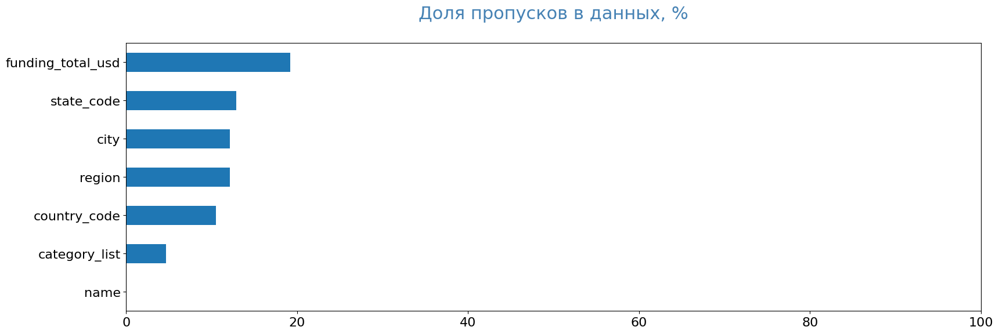

Датасет startup_test:


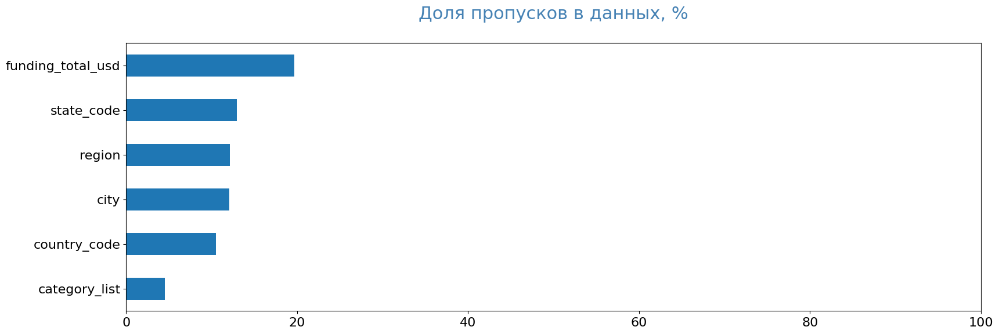

In [295]:
for name, df in dataframes.items():
    print(f'Датасет {name}:')
    pass_value_barh(df)

Теперь доля пропусков в тренировочном и тестовом датасетах примерно одинакова. Мы видим, что наибольшее количество пропусков в сумме финансирования. Также есть пропуски в признаках, характеризующих географическую привязку стартапа, и некоторая доля пропусков в категории. В рамках подготовки пайплайна для модели мы заполним пропуски при помощи  SimpleImputer. Для количественного признака финансирования funding_total_usd будем использовать стратегию медианного значения (из-за наличия аномалий среднее значение слишком велико). Для категориальных признаков региональной привязки используем наиболее часто встречаемое значение, а для категории стартапа используем константу.

Обратим внимание, что в тренировочном датасете есть еще один пропуск в названии компании. Этот параметр мы не будем использовать в качестве входного признака для модели, поэтому заполним этот пропуск значением "No name", чтобы не было пропуска.

In [296]:
startup_data.query('name.isna()')

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at
3291,NaN,Startups,"25,000.00",closed,USA,OR,"Portland, Oregon",Portland,1,2011-10-01,2012-03-01,2012-03-01,2013-06-03


In [297]:
startup_data['name'] = startup_data['name'].fillna('No name')
startup_data.query('name.isna()')
# убираем пропуск в названии и проверяем

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at


### Анализ дубликатов.

#### Анализ явных дубликатов.

In [298]:
for name, df in dataframes.items():
    print(f'Датасет {name}:', df.duplicated().sum())
# считаем явные дубликаты в датасетах

Датасет startup_data: 0
Датасет startup_test: 0


Явных дублей в строках нет. Сделаем дополнительную проверку на уникальность по названию компаний в данных.

In [299]:
for name, df in dataframes.items():
    print(f'Датасет {name}:', df['name'].duplicated().sum())
# считаем дубликаты в названии

Датасет startup_data: 0
Датасет startup_test: 0


Повторов в названии компаний нет.

#### Анализ неявных дубликатов.

In [300]:
def check_dub(data):
    """Эта функция создает и выводит словарь с уникальными значениями столбца для определения неявных дубликатов.

    В качестве аргумента передается название датасета. Функция создает словари формата : столбец = уникальные значения
    в столбце."""
    check_dict = []
    for i in data.columns:
        if (data[i].dtype == 'object') & (i != 'name'):
            check_dict.append([{i: data[i].sort_values().unique()}])
    return check_dict
# пишем функцию проверки на неявные дубликаты в столбцах с типом строки. Функция выведет словарь: столбец - уникальные значения

In [301]:
for name, df in dataframes.items():
    print(f'Датасет {name}:')
    print(check_dub(df))
    print('')
# применяем функцию поиска неявных дубликатов к датасетам

Датасет startup_data:
[[{'category_list': array(['3D', '3D Printing', '3D Printing|3D Technology', ...,
       'mHealth|Software', 'mHealth|Software|Therapeutics', nan],
      dtype=object)}], [{'status': array(['closed', 'operating'], dtype=object)}], [{'country_code': array(['ALB', 'ARE', 'ARG', 'ARM', 'AUS', 'AUT', 'AZE', 'BAH', 'BEL',
       'BGD', 'BGR', 'BHR', 'BLM', 'BLR', 'BLZ', 'BMU', 'BRA', 'BRN',
       'BWA', 'CAN', 'CHE', 'CHL', 'CHN', 'CMR', 'COL', 'CRI', 'CYM',
       'CYP', 'CZE', 'DEU', 'DNK', 'DOM', 'DZA', 'ECU', 'EGY', 'ESP',
       'EST', 'FIN', 'FRA', 'GBR', 'GEO', 'GGY', 'GHA', 'GIB', 'GRC',
       'GRD', 'GTM', 'HKG', 'HND', 'HRV', 'HUN', 'IDN', 'IND', 'IRL',
       'IRN', 'ISL', 'ISR', 'ITA', 'JAM', 'JEY', 'JOR', 'JPN', 'KAZ',
       'KEN', 'KHM', 'KNA', 'KOR', 'KWT', 'LAO', 'LBN', 'LIE', 'LKA',
       'LTU', 'LUX', 'LVA', 'MAF', 'MAR', 'MCO', 'MDA', 'MEX', 'MKD',
       'MLT', 'MMR', 'MNE', 'MOZ', 'MUS', 'MYS', 'NGA', 'NIC', 'NLD',
       'NOR', 'NPL', 'NZL', '

Обратим внимание на столбец с категориями стартапов category_list. В нем в одной ячейке представлены целые списки из разных категорий, из-за чего у нас получилось просто огромное количество уникальных ячеек. Попробуем посмотреть на них подробнее.

In [302]:
category = pd.DataFrame(startup_data['category_list'].sort_values().unique(), columns=['cat'])
category
# смотрим, какие значения принимает столбец category_list. для удобства представим в виде датафрейма.

,cat
0,3D
1,3D Printing
2,3D Printing|3D Technology
3,3D Printing|3D Technology|Android|Artificial Intelligence|Drones|Enterprise Application|Entertainment|Entrepreneur|Games|Lasers|Mobile|Open Source|Robotics|Telecommunications
4,3D Printing|3D Technology|Android|Games|iOS|Mobile|Mobile Games|Mobile Software Tools|Serious Games|Tablets|Video Games
5,3D Printing|3D Technology|Audio|Mass Customization
6,3D Printing|3D Technology|CAD|Cloud Gaming|Printing
7,3D Printing|3D Technology|Consumer Electronics
8,3D Printing|3D Technology|Creative Industries
9,3D Printing|3D Technology|DIY|Printing|Software


Мы видимо, что при 52516 строк в тренировочном датасете у нас 22105 уникальных категорий, что очень много. Попробуем сузить категории. Предположим, что первая категория в списке является основной. Введем новый признак в датасеты - category, в котором поместим только основные категории стартапов.

В значениях в регионах и городах могут прятаться неявные дубликаты, но уникальных значений слишком много, чтобы проводить тщательный анализ. Беглый взгляд не выявил дублей.

### Добавление новых столбцов.

Как было сказано ранее, нам требуется вывести основную категорию стартапа в обоих датасетах. А также преобразовать даты существования стартапа в тренировочной выборке в lifetime с количеством дней. Также нам следует немного укрупнить данные по времени - first_funding_at и last_funding_at. Попробуем добавить признаки с годом финансирования.

#### Выделение основной категории стартапа.

In [303]:
def stay_first(column):
    """Эта функция анализирует столбец и выделяет из него первый элемент по разделителю |.

    В качестве аргумента передается название колонки."""
    if column == column:
        column = column.split('|')
        column = column[0]
        return column
    else:
        column
# Пишем функцию по выделению первой категории из поля category_list 

In [304]:
startup_data['first_category'] = startup_data['category_list'].apply(stay_first)
startup_test['first_category'] = startup_test['category_list'].apply(stay_first)
# применяем функцию к новым столбцам.

In [305]:
startup_data.head()
# проверяем, что получилось

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at,first_category
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,2018-01-01,Online Reservations
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,2018-01-01,Manufacturing
2,Reviva Pharmaceuticals,Biotechnology,"35,456,381.00",operating,USA,CA,SF Bay Area,San Jose,3,2006-01-01,2012-08-20,2014-07-02,2018-01-01,Biotechnology
3,Sancilio and Company,Health Care,"22,250,000.00",operating,NaN,NaN,NaN,NaN,3,2004-01-01,2011-09-01,2014-07-18,2018-01-01,Health Care
4,WireTough Cylinders,Manufacturing,NaN,operating,USA,VA,VA - Other,Bristol,1,2010-05-12,2012-02-01,2012-02-01,2018-01-01,Manufacturing


In [306]:
startup_test.head()
# проверяем, что получилось

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime,first_category
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501,Clean Technology
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717,Hospitality
2,COINPLUS,Finance,"428,257.00",LUX,3,Esch-sur-alzette,Esch-sur-alzette,2,2014-05-15,2014-09-18,1295,Finance
3,Imagine Communications,Software|Video|Video Streaming,"34,700,000.00",USA,CA,San Diego,San Diego,4,2005-01-01,2010-04-20,4748,Software
4,DNA13,Software,"4,530,000.00",CAN,ON,Ottawa,Ottawa,1,2007-05-08,2007-05-08,6209,Software


In [307]:
startup_data[['category_list', 'first_category']].isna().sum()
# Проверяем что в новом столбце не стало пропусков больше, чем было в исходном

category_list     2465
first_category    2465
dtype: int64

In [308]:
startup_test[['category_list', 'first_category']].isna().sum()
# Проверяем что в новом столбце не стало пропусков больше, чем было в исходном

category_list     591
first_category    591
dtype: int64

In [309]:
startup_data.pivot_table(index='first_category', values='name', aggfunc='count')
# строим сводную таблицу по first_category, чтобы убедиться, что уникальных значений стало меньше

,name
first_category,
3D,119
3D Printing,75
3D Technology,32
Accounting,109
Active Lifestyle,24
Ad Targeting,84
Adaptive Equipment,3
Advanced Materials,20
Adventure Travel,34


#### Создание lifetime в тренировочной выборке.

In [310]:
startup_data['lifetime'] = startup_data['closed_at'] - startup_data['founded_at']
startup_data['lifetime'] = startup_data['lifetime'].dt.days.astype('int64')
# добавляем столбец lifetime, заполнив его количеством дней. Приводим дни к формату int, как в тестовой выборке

In [311]:
startup_data['lifetime'].dtype
# проверяем, что тип поля верный

dtype('int64')

In [312]:
startup_data.head()
# смотрим, что получилось

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at,first_category,lifetime
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,2018-01-01,Online Reservations,2998
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,2018-01-01,Manufacturing,4748
2,Reviva Pharmaceuticals,Biotechnology,"35,456,381.00",operating,USA,CA,SF Bay Area,San Jose,3,2006-01-01,2012-08-20,2014-07-02,2018-01-01,Biotechnology,4383
3,Sancilio and Company,Health Care,"22,250,000.00",operating,NaN,NaN,NaN,NaN,3,2004-01-01,2011-09-01,2014-07-18,2018-01-01,Health Care,5114
4,WireTough Cylinders,Manufacturing,NaN,operating,USA,VA,VA - Other,Bristol,1,2010-05-12,2012-02-01,2012-02-01,2018-01-01,Manufacturing,2791


#### Выделение года из first_funding_at и last_funding_at.

In [313]:
startup_data['first_funding_year'] = startup_data['first_funding_at'].dt.year
startup_data['last_funding_year'] = startup_data['last_funding_at'].dt.year
startup_test['first_funding_year'] = startup_test['first_funding_at'].dt.year
startup_test['last_funding_year'] = startup_test['last_funding_at'].dt.year
# Добавляем в таблицы столбцы с годами финансирования

In [314]:
startup_data.head(2)
# смотрим, что получилось

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at,first_category,lifetime,first_funding_year,last_funding_year
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,2018-01-01,Online Reservations,2998,2011,2014
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,2018-01-01,Manufacturing,4748,2010,2014


In [315]:
startup_test.head(2)
# смотрим, что получилось

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime,first_category,first_funding_year,last_funding_year
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501,Clean Technology,2009,2009
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717,Hospitality,2010,2010


### Выводы по предобработке.

На данном этапе исследования мы преобразовали тип данных в столбцах с датами (привели их к формату дат). Затем был произведен анализ пропусков. Около 20% записей в столбцах 'category_list', 'funding_total_usd', 'country_code', 'state_code', 'region', 'city' имеют пропуски. В рамках подготовки пайплайна для модели мы заполним пропуски при помощи SimpleImputer. Для количественного признака финансирования funding_total_usd будем использовать стратегию медианного значения (из-за наличия аномалий среднее значение слишком велико). Для категориальных признаков региональной привязки используем наиболее часто встречаемое значение, а для категории стартапа используем константу. Также мы обнаружили большое количество пропусков в столбце 'closed_at', но мы заполнили эти значения данными о дате снятия отчета (для дальнейшего преобразования в lifetime). \
Далее мы провели анализ дубликатов. Явныз дубликатов в записях не обнаружено. При поиске неявных дубликатов мы обнаружили большое количество уникальных записей в столбце category_list. Также очень много уникальных записей есть в данных о городах и регионах. Беглый взгляд не выявил дублей, хотя есть вероятность, что есть повторяющиеся названия. Оставим это без изменений. \
На последнем шаге данного этапа мы добавили новые характеристики в датасеты: был вычислен признак lifetime для тренировочного датасета, а также мы добавили в оба датасета признак first_category, куда выделили первую категорию в списке category_list, как основную. Данный признак должен лучше подойти для работы модели, что мы проверим на следующих этапах работы. Также мы выделили год из дат начала и последнего финансирования.

In [316]:
print('Результат предобработки:') 
print(f'Cтрок в датасете startup_data до обработки: {len(startup_data_temp)}, после: {len(startup_data)}')
print(f'Cтрок в датасете startup_test до обработки: {len(startup_test_temp)}, после: {len(startup_test)}')

Результат предобработки:
Cтрок в датасете startup_data до обработки: 52516, после: 52516
Cтрок в датасете startup_test до обработки: 13125, после: 13125


##  Исследовательский анализ данных.

Подготовим функции для анализа количественных и категориальных признаков датасетов.

In [317]:
def kol_an(data, column):
    """Эта функция помогает провести анализ количественных признаков датасета.
    Она выводит основные числовые характеристики столбцов, строит гистрограммы и ящик с усами.

    В качестве аргумента передается название датасета и название анализируемой колонки. 
    В результате будет выведен числовой анализ, гистрограмма и ящик с усами"""
    print(f'Основные количественные характеристики признака: {column}')
    print(data[column].describe())
    print(f'Графики по признаку: {column}')
    plt.figure(figsize=(15, 8))
    plot = data[column].hist(color='green')
    plt.xlabel(column)
    plt.ylabel('Кол-во стартапов')
    plt.title(f'Распределение стартапов по признаку: {column}')
    plt.show()
    fig, ax = plt.subplots(figsize = (17,2))
    ax = data[[column]].boxplot(vert = False, ax =ax)
    plt.xlabel(f'{column}')
    ax.set_title(f'Диаграмма размаха значений признака {column}');
    plt.show()
    print('- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -')
# пишем функцию для анализа количественных признаков датасетов

In [318]:
def kat_an(data, column):
    """Эта функция помогает провести анализ категориальных признаков датасета. Она распределяет строки датасета по
    анализируемому параметру, строит столбчатую диаграмму и круговую диаграмму.

    В качестве аргумента передается название датасета и название анализируемой колонки. 
    В результате будет выведено распределение количества строк по колонке, построены столбчатая и круговая диаграмма."""
    kat_group = data[column].value_counts()
    print(f'Распределение стартапов по признаку: {column}')
    print(kat_group)
    kat_name = kat_group.index
    plot = plt.pie(kat_group, labels=kat_name, autopct='%1.2f%%')
    plt.title(f'Диаграммы распределения стартапов по признаку: {column}')
    plt.show()
    fig, ax = plt.subplots(figsize = (17,8))
    ax = kat_group.plot(kind='barh', legend=False)
    plt.xlabel(f'Количество стартапов по признаку: {column}');
    plt.show()
    print('- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -')
# пишем функцию для анализа категориальных признаков

###  Анализ количественных признаков.

Датасет startup_data:

Основные количественные характеристики признака: funding_total_usd
count           42,447.00
mean        18,247,480.66
std        187,117,301.32
min                  1.00
25%            336,027.50
50%          2,000,000.00
75%         10,000,000.00
max     30,079,503,000.00
Name: funding_total_usd, dtype: float64
Графики по признаку: funding_total_usd


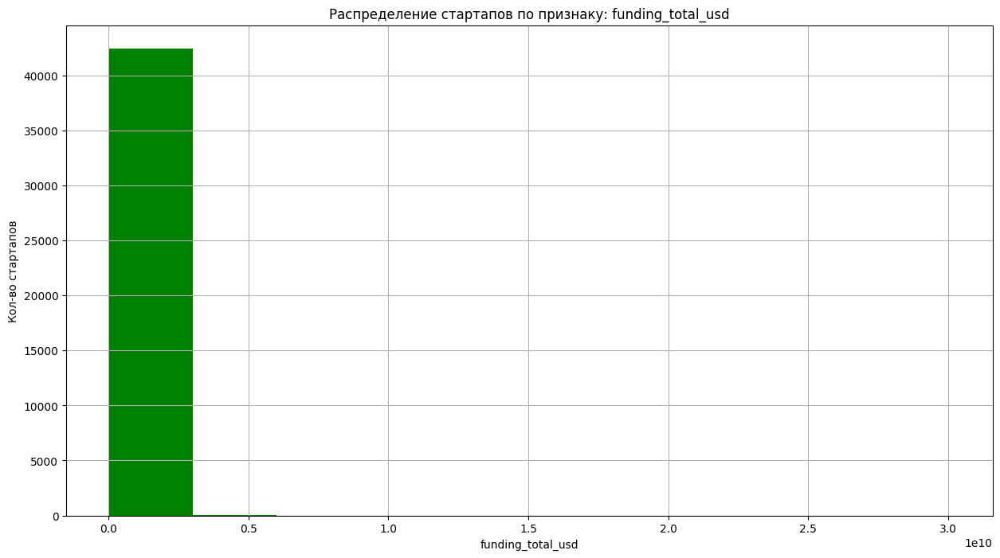

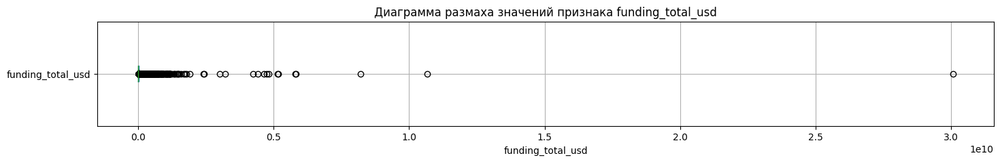

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -
Датасет startup_data:

Основные количественные характеристики признака: funding_rounds
count   52,516.00
mean         1.74
std          1.37
min          1.00
25%          1.00
50%          1.00
75%          2.00
max         19.00
Name: funding_rounds, dtype: float64
Графики по признаку: funding_rounds


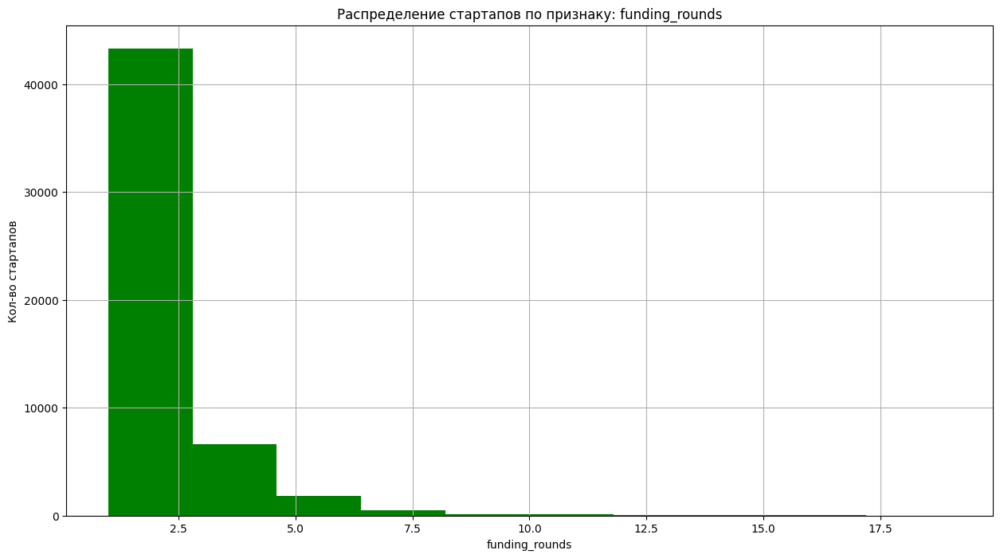

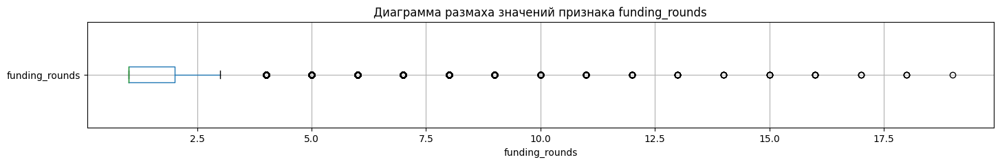

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -
Датасет startup_data:

Основные количественные характеристики признака: lifetime
count   52,516.00
mean     3,140.83
std      2,147.82
min         19.00
25%      1,739.00
50%      2,557.00
75%      4,018.00
max     17,378.00
Name: lifetime, dtype: float64
Графики по признаку: lifetime


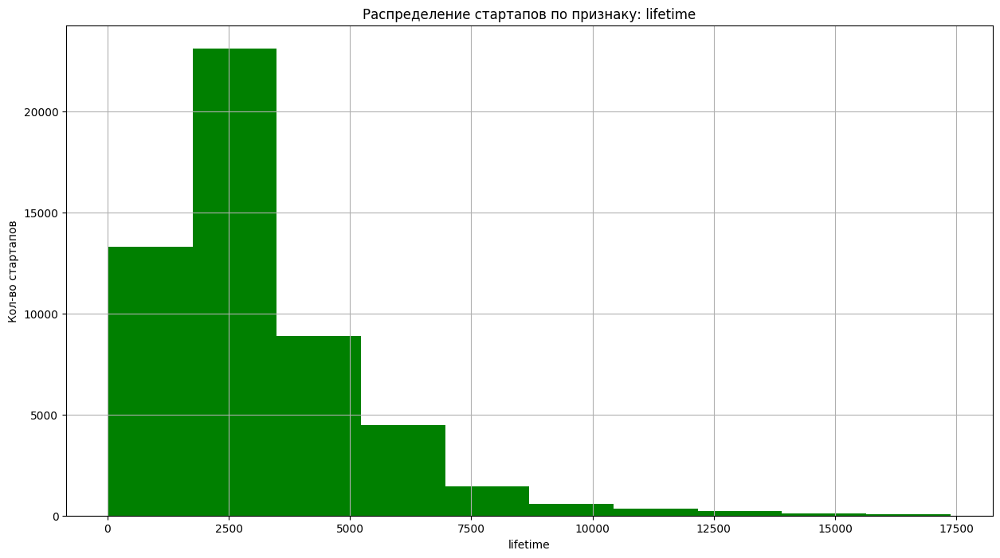

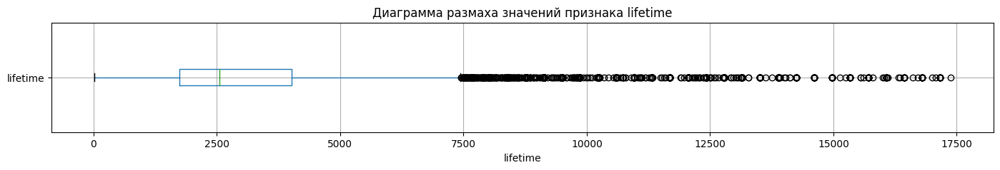

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -


In [319]:
num_list = startup_data.select_dtypes(include=['number']).columns.drop(['first_funding_year', 'last_funding_year']).tolist()
# определяем список количественных признаков датасета startup_data
for i in num_list:
    print('Датасет startup_data:')
    print('')
    kol_an(startup_data, i)
# применяем функцию к списку количественных признаков

Датасет startup_test:

Основные количественные характеристики признака: funding_total_usd
count          10,547.00
mean       16,549,102.70
std        92,172,825.63
min                 1.00
25%           320,000.00
50%         2,000,000.00
75%        10,000,000.00
max     4,715,000,000.00
Name: funding_total_usd, dtype: float64
Графики по признаку: funding_total_usd


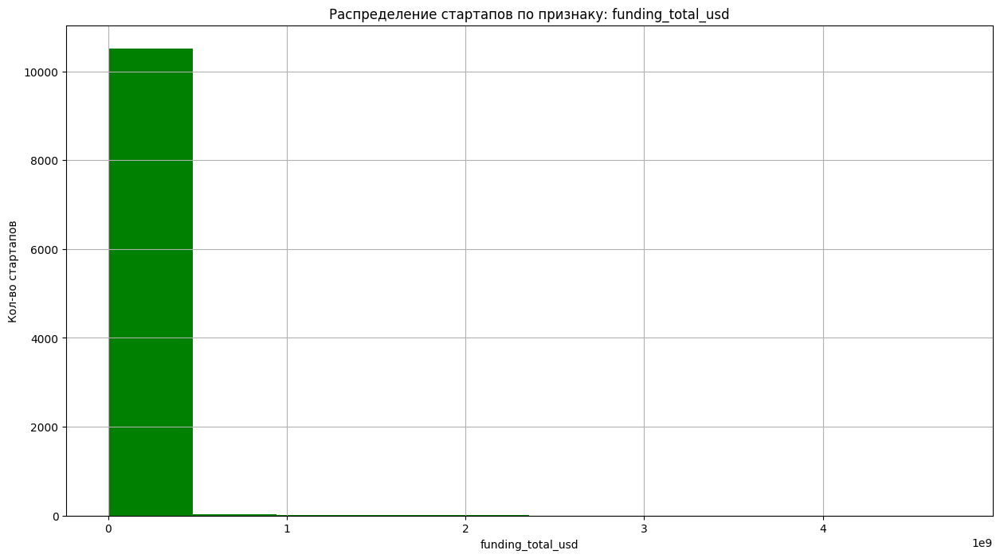

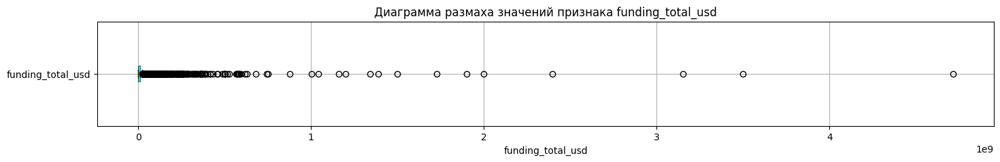

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -
Датасет startup_test:

Основные количественные характеристики признака: funding_rounds
count   13,125.00
mean         1.71
std          1.32
min          1.00
25%          1.00
50%          1.00
75%          2.00
max         15.00
Name: funding_rounds, dtype: float64
Графики по признаку: funding_rounds


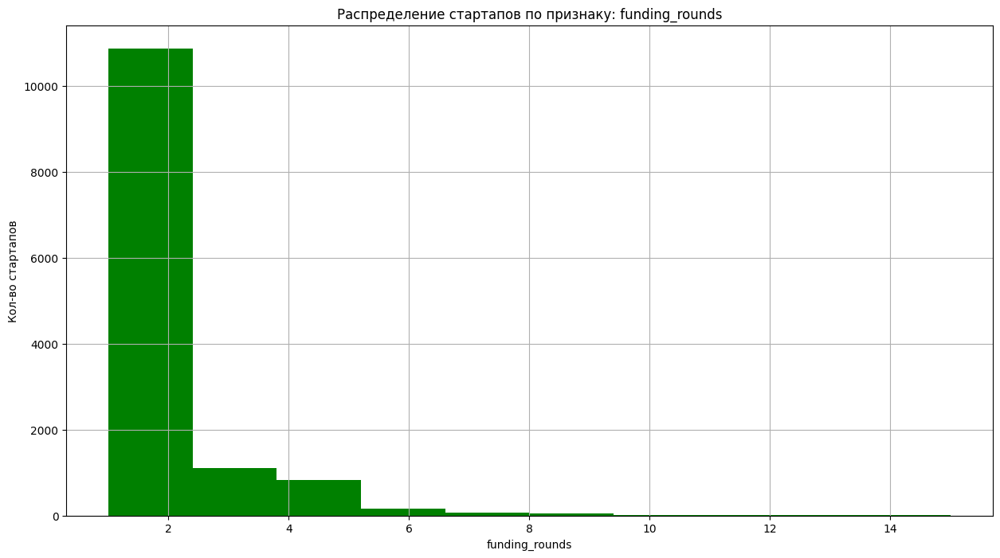

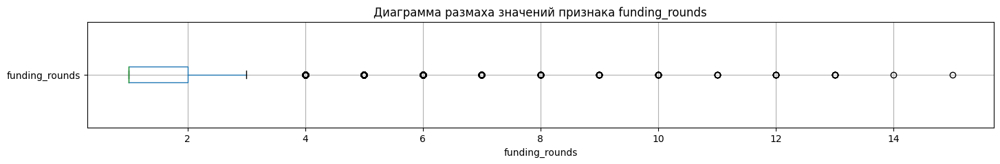

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -
Датасет startup_test:

Основные количественные характеристики признака: lifetime
count   13,125.00
mean     3,097.61
std      2,128.36
min         52.00
25%      1,726.00
50%      2,526.00
75%      3,866.00
max     17,167.00
Name: lifetime, dtype: float64
Графики по признаку: lifetime


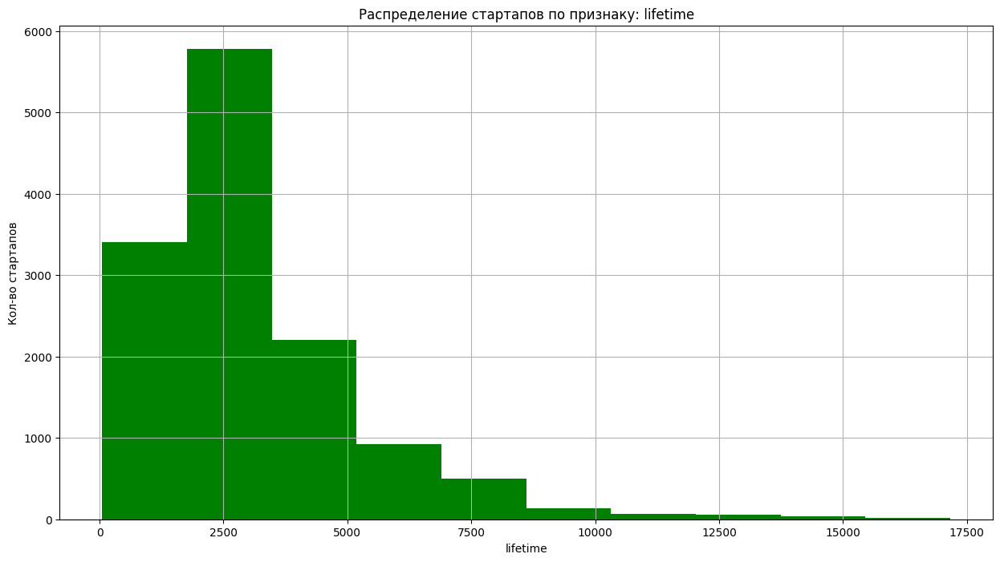

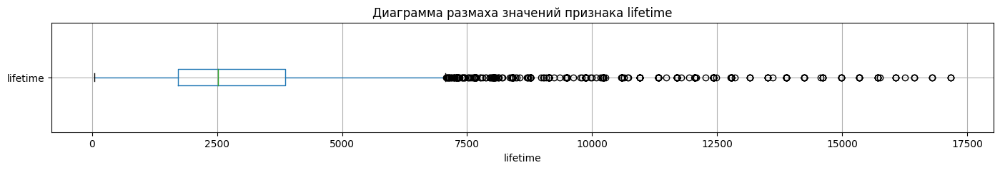

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -


In [320]:
num_list_test = startup_test.select_dtypes(include=['number']).columns.drop(['first_funding_year', 'last_funding_year']).tolist()
# определяем список количественных признаков датасета startup_test
for i in num_list_test:
    print('Датасет startup_test:')
    print('')
    kol_an(startup_test, i)
# применяем функцию к списку количественных признаков

Мы видим, что тренировочная и тестовая выборки соизмеримы по показателям - и там, и там есть большое количество выбросов в количественных характеристиках. При этом нельзя сказать, что по признакам lifetime и funding_rounds выбросы являются какими-то аномалиями или ошибками - скорее это редкие стартапы, которые можно назвать очень успешными - с большим жизненным циклом и финансированием. Рынок стартапов имеет высокие риски, поэтому малое количество таких компаний вполне объяснимо. В признаке funding_total_usd тоже наблюдается такая закономерность, однако в тренировочной выборке есть выброс в 30 млрд. Посмотрим на него.

In [321]:
startup_data.query('funding_total_usd > 29000000000')
# смотрим на выбросы с аномально высоким значением

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at,first_category,lifetime,first_funding_year,last_funding_year
39186,Verizon Communications,Communications Infrastructure|Information Technology|Mobile,"30,079,503,000.00",operating,USA,NY,New York City,New York,5,1983-10-07,2010-01-26,2014-02-28,2018-01-01,Communications Infrastructure,12505,2010,2014


Похоже, компания Verizon Communications стала весьма успешной. Однако, лучше убрать ее из тренировочного датасета, чтобы ее впечатляющие финансовые показатели не сильно повляли на модель.

In [322]:
startup_data = startup_data.query('funding_total_usd != 30079503000').reset_index(drop=True)
# убираем из датасета строку с выбросом

In [323]:
print(len(startup_data_temp), len(startup_data))
# проверка, сколько строк осталось

52516 52515


Теперь попробуем изучить количественные показатели в разрезе целевого признака status.

In [324]:
def status_view(data, column):
    """Эта функция помогает провести анализ распределения по целевому признаку количественных признаков датасета.
    Она выводит количество, среднее, медианное значение признака в разрезе целевого и строит гистрограмму по медианному значению.

    В качестве аргумента передается название датасета, название анализируемой колонки."""
    pivot_status = data.pivot_table(index='status', values=column, aggfunc=['count', 'mean', 'median', 'sum', 'max', 'min'])
    display(pivot_status)
    plot = pivot_status['median'].plot(kind='bar', figsize=(15, 5), legend=False, color='blue')
    plt.ylabel(column);
    plt.title(f'Распределение стартапов по медианному значению признака: {column}')
    plt.show()
# пишем функцию по анализу количественного признака в разрезе целевого

,count,mean,median,sum,max,min
,funding_total_usd,funding_total_usd,funding_total_usd,funding_total_usd,funding_total_usd,funding_total_usd
status,,,,,,
closed,3892,"11,281,157.46","1,300,000.00","43,906,264,841.14","1,567,504,319.00",2.00
operating,38554,"18,171,008.03","2,000,000.00","700,565,043,617.41","10,664,943,639.00",1.00


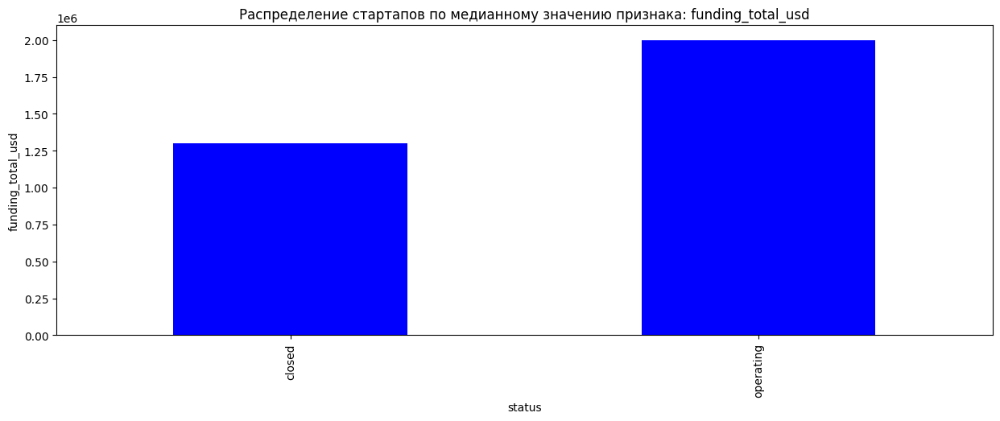

,count,mean,median,sum,max,min
,funding_rounds,funding_rounds,funding_rounds,funding_rounds,funding_rounds,funding_rounds
status,,,,,,
closed,4917,1.40,1,6905,11,1
operating,47598,1.78,1,84503,19,1


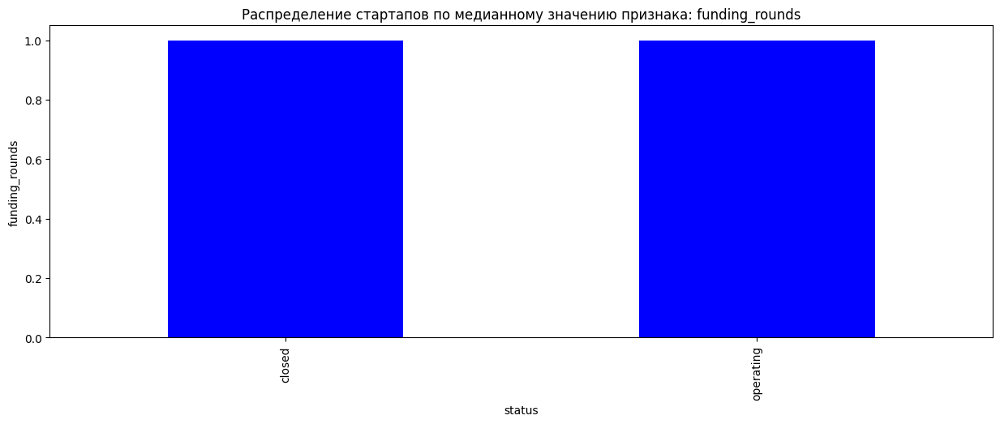

,count,mean,median,sum,max,min
,lifetime,lifetime,lifetime,lifetime,lifetime,lifetime
status,,,,,,
closed,4917,"1,399.25",1013,6880112,17004,19
operating,47598,"3,320.54",2579,158051113,17378,731


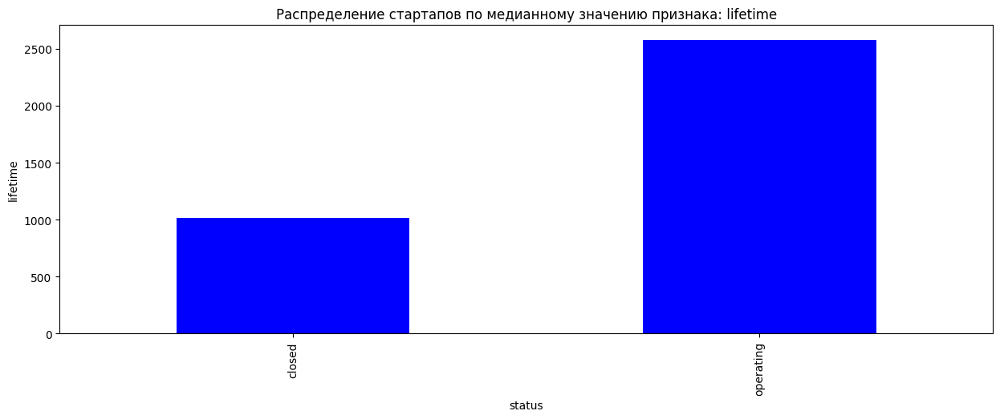

In [325]:
for i in num_list:
    status_view(startup_data, i)
# применяем функцию к списку количественных признаков

Анализ показывает, что большая часть стартапов все еще успешно функционирует. Мы видим, что средние и медианные значения сумм финансирования несколько ниже у закрытых компаний, что логично (в более успешные компании вкладывают больше средств). \
А вот число раундов финансирования не сильно отличается. Максимальное количество таких раундов больше у действующих компаний, но вот средние и медианные значения не сильно отличаются от закрытых компаний (медиана вообще одинаково и составляет 1 раунд). Можно сделать предварительно вывод, что число раундов финансирования не является важным показателем успешности компании. \
Время жизни в днях у закрытых компаний - ожидаемо ниже чем у действующих, но отметим что максимальные значения довольно близки - нельзя утверждать, что долгое время работы гарантирует успешность. Но минимальное значение в 740 дней у действующих компаний позволяет предположить, что жизненный цикл более двух лет - повышает шанс компании стать успешной.

In [326]:
#plt.figure(figsize=(15, 8))
#plot = sns.histplot(data=startup_data, x='funding_total_usd', palette='hls', hue='status')
#plt.xlabel('funding_total_usd')
#plt.ylabel('Кол-во стартапов')
#plt.title('Распределение стартапов по признаку: funding_total_usd')
#plt.show()

###  Анализ категориальных признаков.

В исходных датасетах многие категориальные признаки имеют очень большое количество значений. Проанализировать данные по городам или списку category_list будет сложно. Посмотрим сначала на признаки, не имеющие такого большого разброса значений.

In [327]:
col_list = ['status', 'first_funding_year', 'last_funding_year']
# определяем список категориальных признаков с не очень большим количеством значений

Датасет startup_data:

Распределение стартапов по признаку: status
operating    47598
closed        4917
Name: status, dtype: int64


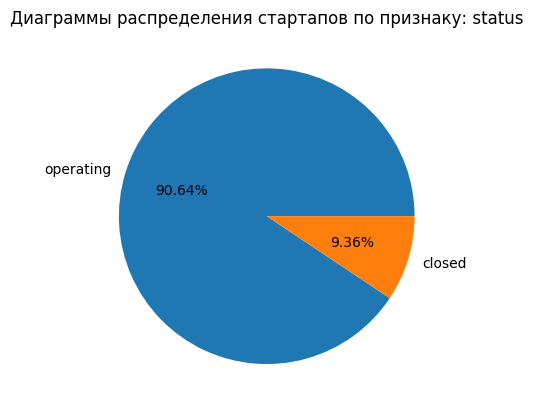

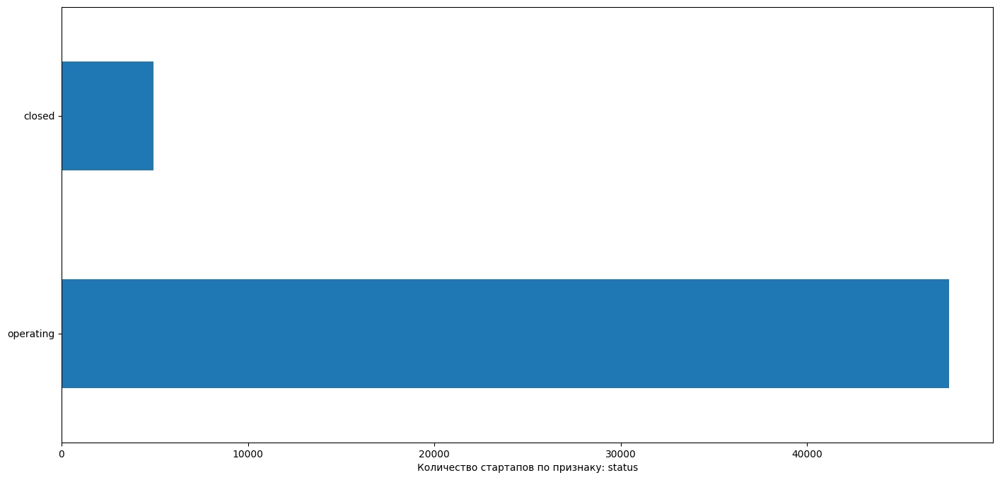

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -
Датасет startup_data:

Распределение стартапов по признаку: first_funding_year
2014    9348
2013    7862
2015    6448
2012    6074
2011    4975
2010    3957
2009    3198
2007    2352
2008    2329
2006    1597
2005    1313
2004     718
2003     621
2001     474
2002     430
2000     356
1999     262
1998      54
1996      33
1997      22
1995      14
1994      14
1993      11
1990      11
1992       9
1989       5
1985       5
1991       5
1984       4
1988       3
1987       3
1986       3
1982       2
1979       1
1983       1
1977       1
Name: first_funding_year, dtype: int64


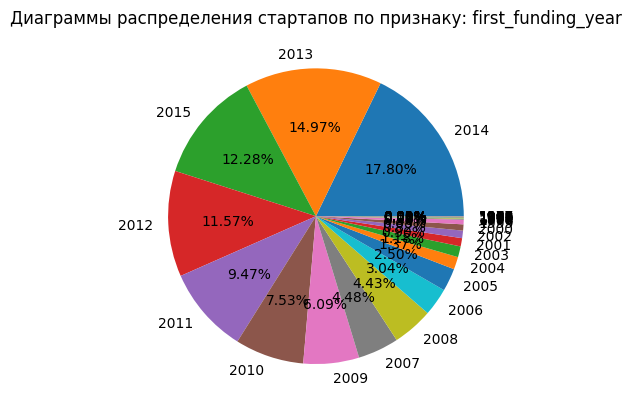

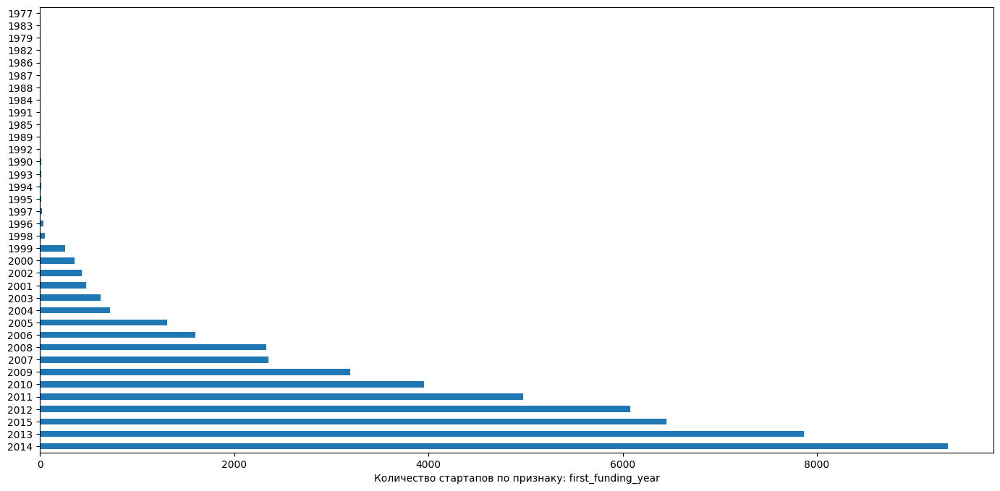

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -
Датасет startup_data:

Распределение стартапов по признаку: last_funding_year
2015    11734
2014    11529
2013     7510
2012     5087
2011     4043
2010     3125
2009     2314
2008     1806
2007     1667
2006      948
2005      721
2004      460
2003      433
2001      312
2002      260
2000      234
1999      174
1998       33
1996       23
1997       17
1995       12
1994       12
1993       11
1990       10
1992        9
1991        5
1989        5
1985        4
1987        3
1986        3
1984        3
1988        3
1982        2
1979        1
1983        1
1977        1
Name: last_funding_year, dtype: int64


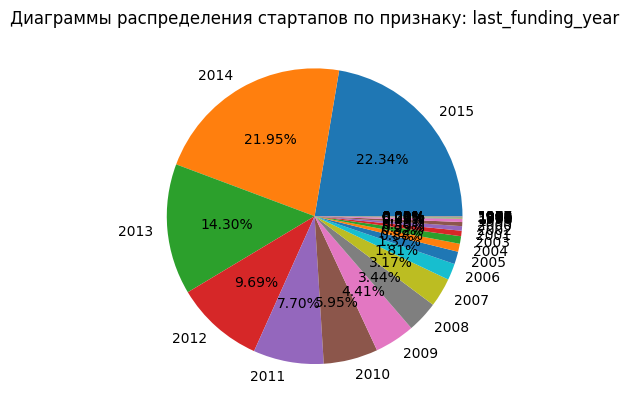

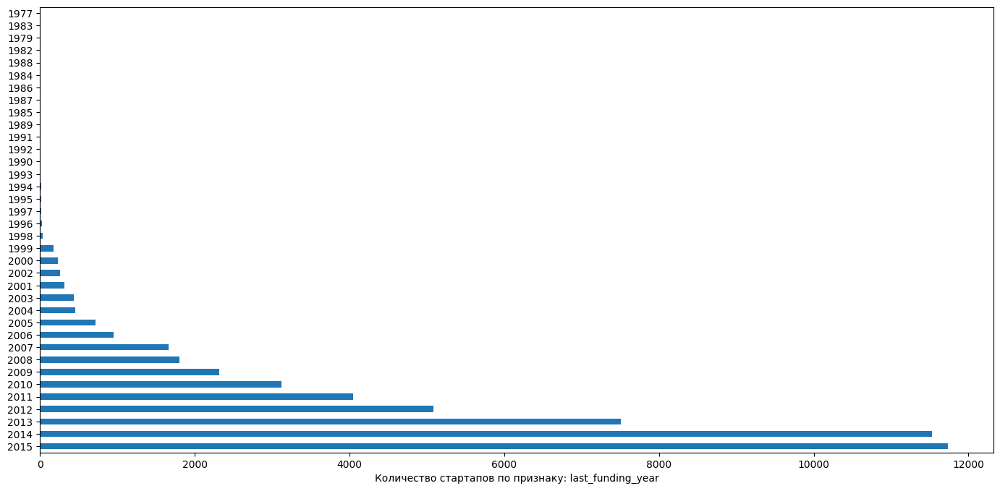

- - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - - - - - - - - - - - -  - - - - - - - -


In [328]:
for i in col_list:
    print('Датасет startup_data:')
    print('')
    kat_an(startup_data, i)
# применяем функцию к списку категориальных признаков

In [329]:
print('Доля закрытых компаний в общей структуре датасета составляет:', round(4917/(47598+4917), 2))

Доля закрытых компаний в общей структуре датасета составляет: 0.09


In [330]:
def kat_view(data, column, top):
    """Эта функция помогает провести анализ распределения по целевому признаку качественных признаков датасета.
    Она составляет сводную таблицу по признаку с распределением по целевым значениям, оставляет только признаки с количеством стартапов больше 10.
    Затем осуществляется сортировка по доли закрывшихся стартапов от большей к меньшей. И строится гистрограмма по долям из топа значений.

    В качестве аргумента передается название датасета, название анализируемой колонки и количество из топа значений для гистограммы."""
    print(f'Доли закрывшихся стартапов по топ-{top} значений признака: {column}')
    pivot_data = data.pivot_table(index=column, columns='status', values='name', aggfunc='count').sort_values(by=column, ascending=True)
    pivot_data.columns = ['closed', 'operating']
    pivot_data['closed'] = pivot_data['closed'].fillna(0)
    pivot_data['operating'] = pivot_data['operating'].fillna(0)
    pivot_data['close_rate'] = pivot_data['closed'] / (pivot_data['closed'] + pivot_data['operating'])
    pivot_data = pivot_data.query('(closed + operating) > 10')
    pivot_data = pivot_data.sort_values(by='close_rate', ascending=False)
    display(pivot_data)
    plot = pivot_data['close_rate'].head(top).plot(kind='barh', figsize=(15, 5), legend=False, color='red')
    plt.xlabel('close_rate');
    plt.title(f'Топ-{top} по наибольшим долям закрывшихся стартапов по признаку: {column}')
    plt.show()
    plot_2 = pivot_data['close_rate'].tail(top).plot(kind='barh', figsize=(15, 5), legend=False, color='green')
    plt.xlabel('close_rate');
    plt.title(f'Топ-{top} по наименьшим долям закрывшихся стартапов по признаку: {column}')
    plt.show() 
# пишем функцию по анализу качественного признака в разрезе целевого при большом количестве категорий

In [331]:
col_list_2 = ['country_code', 'state_code', 'region', 'city', 'first_category']
# определяем список категориальных признаков с очень большим количеством значений

Датасет startup_data:

Доли закрывшихся стартапов по топ-10 значений признака: country_code


,closed,operating,close_rate
country_code,,,
RUS,130.00,239.00,0.35
PER,9.00,25.00,0.26
UGA,2.00,11.00,0.15
PAK,4.00,25.00,0.14
ISL,2.00,13.00,0.13
LUX,3.00,20.00,0.13
BRA,42.00,313.00,0.12
NZL,9.00,68.00,0.12
CZE,6.00,47.00,0.11


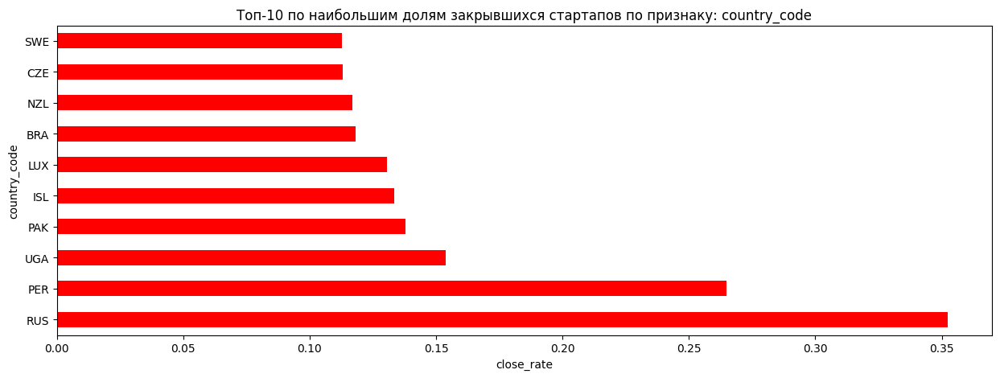

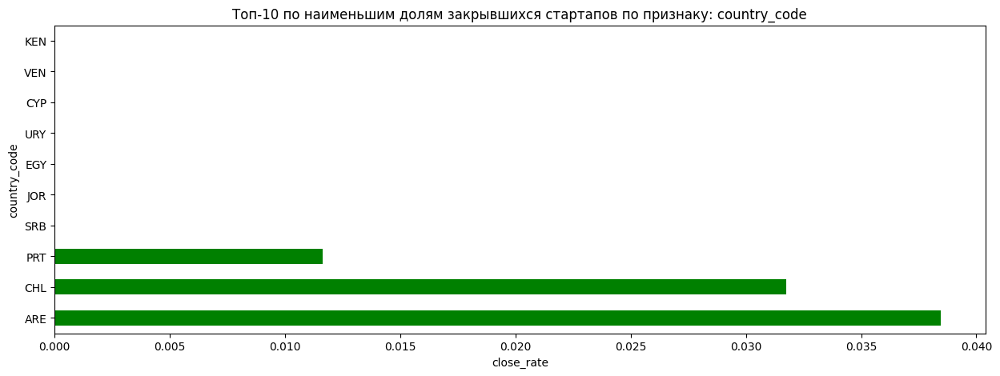

Датасет startup_data:

Доли закрывшихся стартапов по топ-10 значений признака: state_code


,closed,operating,close_rate
state_code,,,
48,84.00,183.00,0.31
66,9.00,20.00,0.31
H3,3.00,11.00,0.21
D9,4.00,17.00,0.19
G2,5.00,22.00,0.19
M4,2.00,9.00,0.18
P8,3.00,14.00,0.18
NL,3.00,14.00,0.18
F2,6.00,28.00,0.18


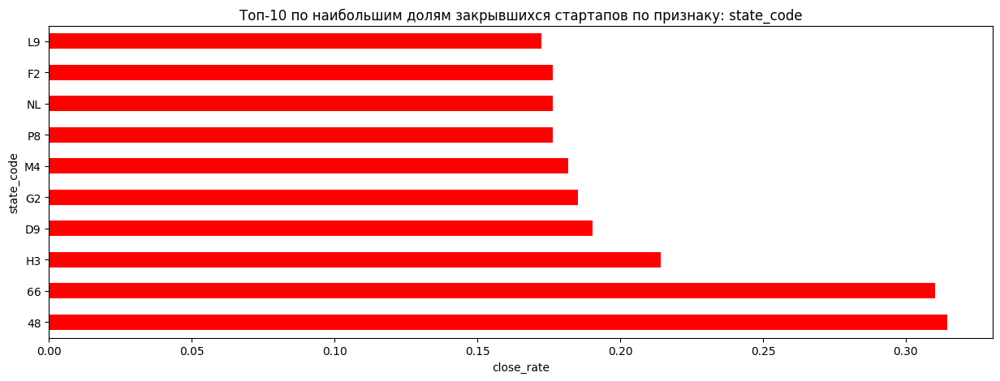

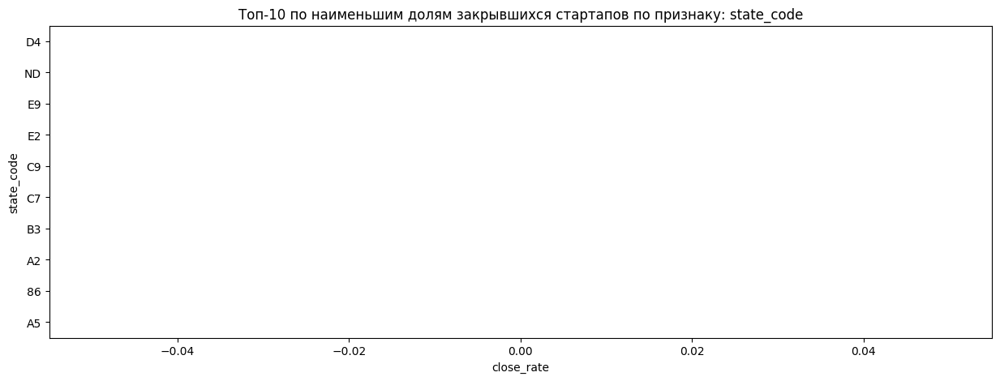

Датасет startup_data:

Доли закрывшихся стартапов по топ-10 значений признака: region


,closed,operating,close_rate
region,,,
RUS - Other,7.00,14.00,0.33
Moscow,83.00,182.00,0.31
St. Petersburg,9.00,20.00,0.31
QC - Other,3.00,9.00,0.25
Galway,4.00,12.00,0.25
BRA - Other,14.00,45.00,0.24
Quebec City,8.00,27.00,0.23
New Bedford,4.00,14.00,0.22
Lima,6.00,22.00,0.21


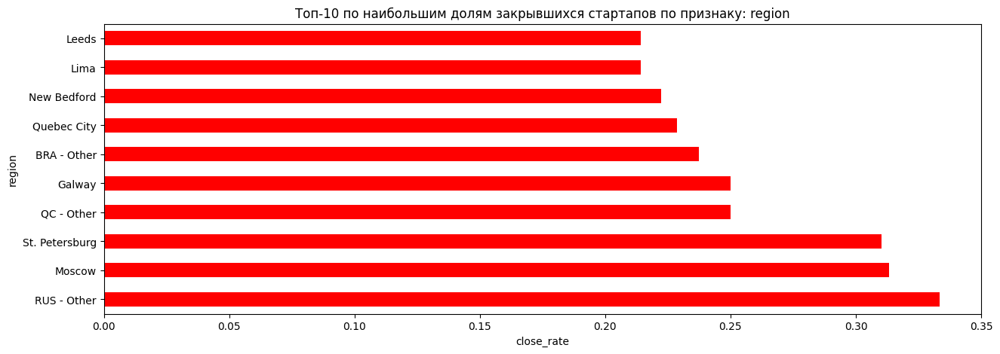

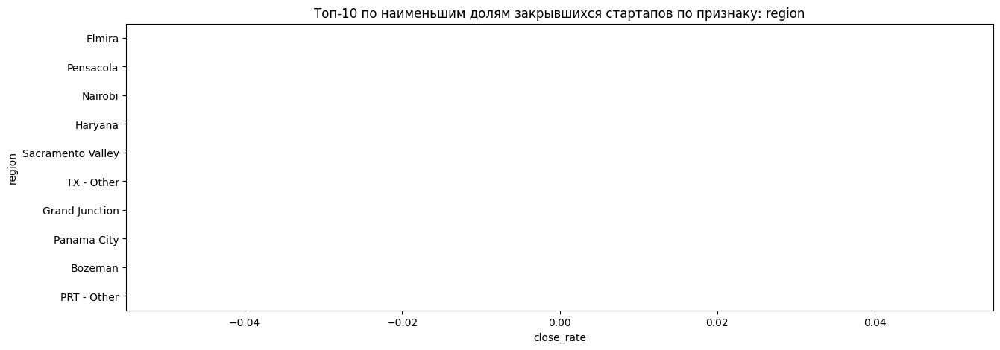

Датасет startup_data:

Доли закрывшихся стартапов по топ-10 значений признака: city


,closed,operating,close_rate
city,,,
Lucerne Valley,8.00,15.00,0.35
Makati,4.00,8.00,0.33
Moscow,83.00,185.00,0.31
Edison,4.00,10.00,0.29
Longmont,5.00,13.00,0.28
Allentown,3.00,8.00,0.27
Kista,4.00,11.00,0.27
Saint Petersburg,9.00,25.00,0.26
Hartford,4.00,12.00,0.25


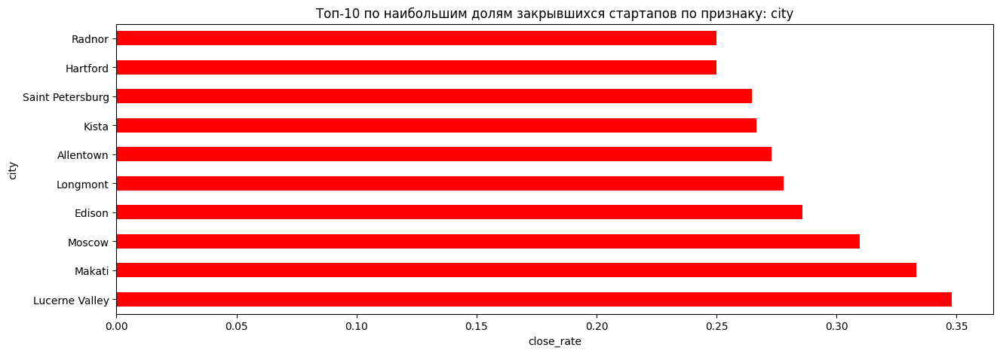

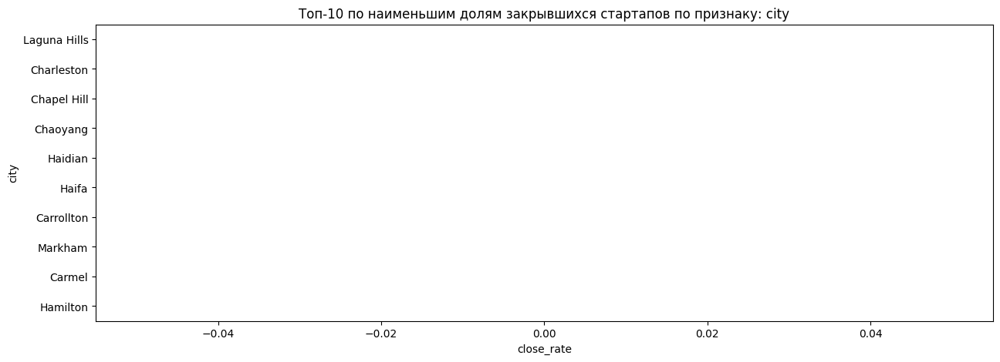

Датасет startup_data:

Доли закрывшихся стартапов по топ-10 значений признака: first_category


,closed,operating,close_rate
first_category,,,
Identity,4.00,9.00,0.31
Innovation Management,6.00,14.00,0.30
Journalism,4.00,10.00,0.29
Service Providers,9.00,23.00,0.28
iPhone,10.00,26.00,0.28
Babies,8.00,23.00,0.26
Coupons,17.00,55.00,0.24
Engineering Firms,4.00,13.00,0.24
Storage,4.00,13.00,0.24


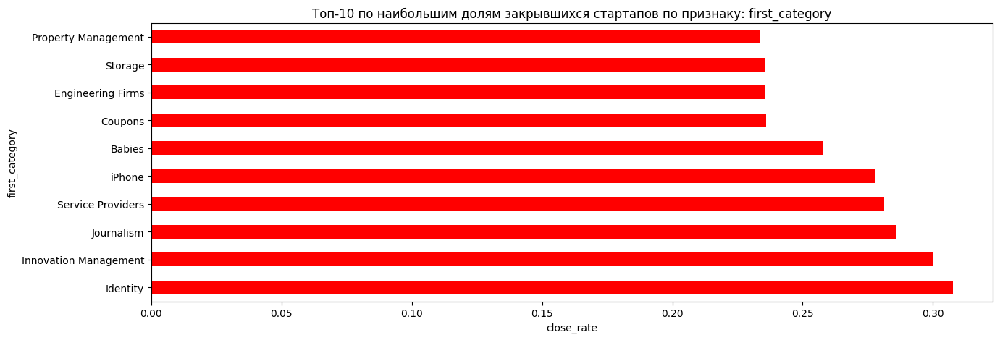

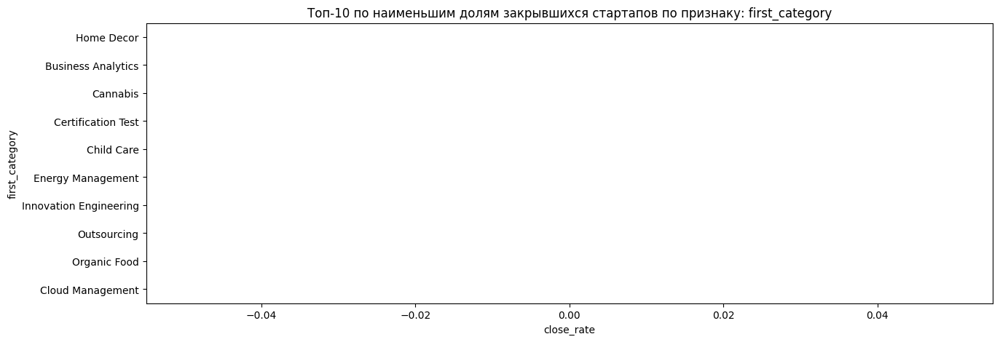

In [332]:
for j in col_list_2:
    print('Датасет startup_data:')
    print('')
    kat_view(startup_data, j, 10)
# применяем функцию к списку категориальных признаков

Анализ категориальных значений сильно затруднен тем, что признаки имеют очень большое количество уникальных значений. Мы разделили список признаков на характеристики с небольшим набором значений и с большим набором значений.
В список с небольшим набором категорий вошли: 'status', 'first_funding_year', 'last_funding_year'. \
В список с большим набором категорий вошли: 'country_code', 'state_code', 'region', 'city', 'first_category' \
По первому списку мы проанализировали весь набор данных. По статусу мы видим, что примерно 9% компаний из тренировочного датасета закрылись. Целевой признак не сбалансирован.\
По годам финансирования мы видим, что у нас есть значительный перекос в сторону последних лет. По большему количеству компаний последнее финансирование было в 2014 и 2015 годах, а чем дальше в прошлое, тем меньше таких компаний. \
По остальным категориальным признакам мы свели данные в группы и посмотрели на распределение этих групп по целевому признаку статуса. А также посмотрели, какую долю занимают в этих группах закрывшиеся компании. При этом мы отбросили группы, в которые вошло меньше 10 компаний, как слишком малозначящие уникальные компании. \
При анализе страны компаний, мы видим, что наибольшая доля закрытых компаний - в России (35%) и Перу (26%). В абсолютных величинах лидирует США, но в датасетах большую часть компаний составляют именно американские, и доля закрытых по ним составляет всего 8%. \
Наибольшая доля закрытых компаний по признаку state_code - в 48 и 66. По региону, как и по стране - в лидерах Россия - 33% закрытых по России в целом, и по 31% приходится на Москву и Санкт-Петербург. По городам самые неудачные варианты: Lucerne Valley,  Makati и Moscow. \
Анализ первой категории бизнеса показал, что самые рисковые категории: Identity (31%), Innovation Management (30%) и Journalism (29%).

###  Корреляционный анализ.

Построим матрицу корреляции признаков Фи. Предварительно исключим признаки со слишком большим набором уникальных значений, которые вряд ли сильно помогут модели предсказывать статус - name, category_list, state_code, region, city. А также исключим из анализа даты, для которых мы ранее ввели новые признаки, которые и будем использовать в модели - founded_at, closed_at, first_funding_at и last_funding_at.

In [333]:
phik_matrix = startup_data.drop(['name', 'category_list', 'state_code', 'region', 'city', 'founded_at', 'closed_at', \
                                 'first_funding_at', 'last_funding_at'], axis=1).phik_matrix()
phik_matrix
# строим матрицу корреляции Фи для тренировочного датасета startup_data

interval columns not set, guessing: ['funding_total_usd', 'funding_rounds', 'lifetime', 'first_funding_year', 'last_funding_year']


,funding_total_usd,status,country_code,funding_rounds,first_category,lifetime,first_funding_year,last_funding_year
funding_total_usd,1.00,0.00,0.00,0.18,0.00,0.05,0.10,0.05
status,0.00,1.00,0.12,0.10,0.16,0.54,0.18,0.24
country_code,0.00,0.12,1.00,0.00,0.70,0.19,0.15,0.10
funding_rounds,0.18,0.10,0.00,1.00,0.01,0.25,0.27,0.15
first_category,0.00,0.16,0.70,0.01,1.00,0.37,0.39,0.37
lifetime,0.05,0.54,0.19,0.25,0.37,1.00,0.66,0.56
first_funding_year,0.10,0.18,0.15,0.27,0.39,0.66,1.00,1.00
last_funding_year,0.05,0.24,0.10,0.15,0.37,0.56,1.00,1.00


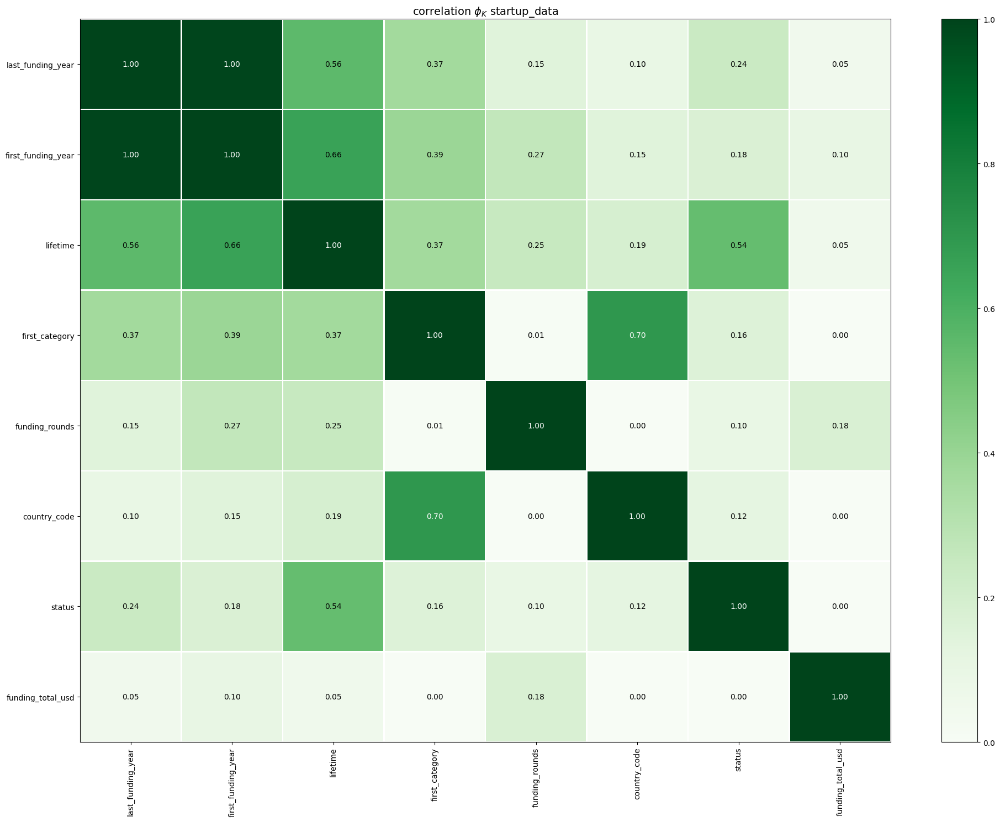

In [334]:
interval_cols = startup_data.select_dtypes(include=['number']).columns.tolist()

phik_overview = startup_data.drop(['name', 'category_list', 'state_code', 'region', 'city', 'founded_at', 'closed_at', \
                                 'first_funding_at', 'last_funding_at'], axis=1).phik_matrix(interval_cols=interval_cols)

plot_correlation_matrix(
    phik_overview.values,
    x_labels=phik_overview.columns,
    y_labels=phik_overview.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$ startup_data',
    figsize=(20, 15)
) 
# рисуем матрицу корреляции для startup_data

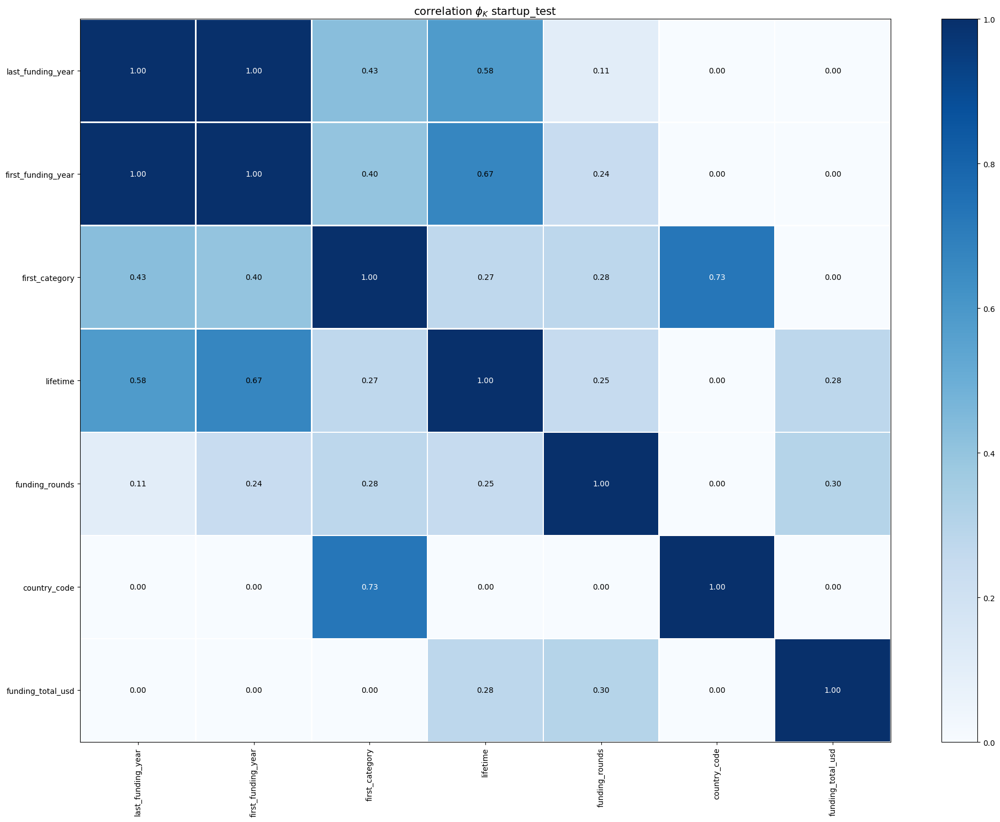

In [335]:
interval_cols_2 = startup_test.select_dtypes(include=['number']).columns.tolist()

phik_overview_2 = startup_test.drop(['name', 'category_list', 'state_code', 'region', 'city', \
                                 'first_funding_at', 'last_funding_at'], axis=1).phik_matrix(interval_cols=interval_cols_2)

plot_correlation_matrix(
    phik_overview_2.values,
    x_labels=phik_overview_2.columns,
    y_labels=phik_overview_2.index,
    vmin=0, vmax=1, color_map='Blues',
    title=r'correlation $\phi_K$ startup_test',
    figsize=(20, 15)
) 
# рисуем матрицу корреляции для job_data_test для проверки мультиколлинеарности тестовой выборки

Мы видим, что наибольшая корреляция у целевого признака status с признаком lifetime (0.54). С остальными признаками связь довольно слабая. С признаком funding_total_usd коэффициент равен нулю. Попробуем преобразовать его для увеличения связи на следующем этапе. Также мы видим, что есть мультиколлинеарность между признаками last_funding_year и first_funding_year. Для работы модели оставим в данных только один из них - last_funding_year (у него выше коэффициент корреляции к статусу).

###  Выводы по исследовательскому анализу.

На первом шаге данного этапа мы провели анализ количественных признаков датасета. \
Анализ показывает, что большая часть стартапов все еще успешно функционирует. Мы видим, что средние и медианные значения сумм финансирования несколько ниже у закрытых компаний, что логично (в более успешные компании вкладывают больше средств).
А вот число раундов финансирования не сильно отличается. Максимальное количество таких раундов больше у действующих компаний, но вот средние и медианные значения не сильно отличаются от закрытых компаний (медиана вообще одинаково и составляет 1 раунд). Можно сделать предварительно вывод, что число раундов финансирования не является важным показателем успешности компании.
Время жизни в днях у закрытых компаний - ожидаемо ниже чем у действующих, но отметим что максимальные значения довольно близки - нельзя утверждать, что долгое время работы гарантирует успешность. Но минимальное значение в 740 дней у действующих компаний позволяет предположить, что жизненный цикл более двух лет - повышает шанс компании стать успешной. \
Затем мы провели анализ категориальных признаков.
Анализ категориальных значений сильно затруднен тем, что признаки имеют очень большое количество уникальных значений. Мы разделили список признаков на характеристики с небольшим набором значений и с большим набором значений. В список с небольшим набором категорий вошли: 'status', 'first_funding_year', 'last_funding_year'.
В список с большим набором категорий вошли: 'country_code', 'state_code', 'region', 'city', 'first_category'
По первому списку мы проанализировали весь набор данных. По статусу мы видим, что примерно 9% компаний из тренировочного датасета закрылись. Целевой признак не сбалансирован.
По годам финансирования мы видим, что у нас есть значительный перекос в сторону последних лет. По большему количеству компаний последнее финансирование было в 2014 и 2015 годах, а чем дальше в прошлое, тем меньше таких компаний.
По остальным категориальным признакам мы свели данные в группы и посмотрели на распределение этих групп по целевому признаку статуса. А также посмотрели, какую долю занимают в этих группах закрывшиеся компании. При этом мы отбросили группы, в которые вошло меньше 10 компаний, как слишком малозначящие уникальные компании.
При анализе страны компаний, мы видим, что наибольшая доля закрытых компаний - в России (35%) и Перу (26%). В абсолютных величинах лидирует США, но в датасетах большую часть компаний составляют именно американские, и доля закрытых по ним составляет всего 8%.
Наибольшая доля закрытых компаний по признаку state_code - в 48 и 66. По региону, как и по стране - в лидерах Россия - 33% закрытых по России в целом, и по 31% приходится на Москву и Санкт-Петербург. По городам самые неудачные варианты: Lucerne Valley, Makati и Moscow.
Анализ первой категории бизнеса показал, что самые рисковые категории: Identity (31%), Innovation Management (30%) и Journalism (29%). \
На финальном шаге этапа был проведен корреляционный анализ датасетов. Предварительно мы исключили из анализа категориальные признаки, имеющие слишком большое количество уникальных значений, чтобы принести пользу в работу модели, а также исключили отсутствующие признаки тестового датасета. \
Мы видим, что наибольшая корреляция у целевого признака status с признаком lifetime (0.54). С остальными признаками связь довольно слабая. С признаком funding_total_usd коэффициент равен нулю. Попробуем преобразовать его для увеличения связи на следующем этапе. Также мы видим, что есть мультиколлинеарность между признаками last_funding_year и first_funding_year. Для работы модели оставим в данных только один из них - last_funding_year (у него выше коэффициент корреляции к статусу).

##  Подготовка данных для модели.

###  Добавление признаков и исключение лишних.

In [336]:
startup_data.head(2)
# смотрим еще раз на имеющиеся данные

,name,category_list,funding_total_usd,status,country_code,state_code,region,city,funding_rounds,founded_at,first_funding_at,last_funding_at,closed_at,first_category,lifetime,first_funding_year,last_funding_year
0,Lunchgate,Online Reservations|Restaurants,"828,626.00",operating,CHE,25,Zurich,Zürich,2,2009-10-17,2011-05-01,2014-12-01,2018-01-01,Online Reservations,2998,2011,2014
1,EarLens,Manufacturing|Medical|Medical Devices,"42,935,019.00",operating,USA,CA,SF Bay Area,Redwood City,4,2005-01-01,2010-05-04,2014-02-25,2018-01-01,Manufacturing,4748,2010,2014


In [337]:
startup_test.head(2)
# смотрим еще раз на имеющиеся данные

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime,first_category,first_funding_year,last_funding_year
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501,Clean Technology,2009,2009
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717,Hospitality,2010,2010


Во время корреляционного анализа мы пришли к выводу, что большое количество признаков с уникальными комбинациями не привнесет полезного в работу модели. Уберем эти признаки из датасетов для модели. Например, значений для городов и регионов очень много. Для работы по географической привязки нам может быть достаточно страны country_code. Также очень велик набор комбинаций в признаке category_list. Оставим для модели только выведенный ранее first_category. Также уберем отсутствующие в тестовой выборке founded_at и closed_at, и даты first_funding_at/last_funding_at, вместо которых мы ввели last_funding_year и first_funding_year. Поскольку корреляционный анализ показал мультиколлинеарность last_funding_year и first_funding_year - удалим и first_funding_year из данных для модели.

In [338]:
model_train = startup_data.drop(['name', 'category_list', 'state_code', 'region', 'city', 'founded_at', 'first_funding_at', 'last_funding_at', \
                                 'closed_at', 'first_funding_year'], axis=1)
model_test = startup_test.drop(['name', 'category_list', 'state_code', 'region', 'city', 'first_funding_at', 'last_funding_at', \
                                'first_funding_year'], axis=1)
# готовим датасеты для обучения моделей

In [339]:
model_train.head(2)
# смотрим, что получилось

,funding_total_usd,status,country_code,funding_rounds,first_category,lifetime,last_funding_year
0,"828,626.00",operating,CHE,2,Online Reservations,2998,2014
1,"42,935,019.00",operating,USA,4,Manufacturing,4748,2014


In [340]:
model_test.head(2)
# смотрим, что получилось

,funding_total_usd,country_code,funding_rounds,lifetime,first_category,last_funding_year
0,"2,819,200.00",NIC,1,3501,Clean Technology,2009
1,NaN,USA,1,2717,Hospitality,2010


Теперь попробуем что-то сделать с признаком funding_total_usd. В текущем виде он не показывает какой-либо линейной зависимости со статусом компании. Попробуем разбить компании на категории в зависимости от объема финансирования.

In [341]:
model_train['funding_total_usd'].describe()
# смотрим на основные значения, чтобы определить возможные категории.

count           42,446.00
mean        17,539,257.14
std        117,143,578.47
min                  1.00
25%            336,013.75
50%          2,000,000.00
75%         10,000,000.00
max     10,664,943,639.00
Name: funding_total_usd, dtype: float64

In [342]:
def fund_level(fund):
    """Эта функция распределяет компании по уровню финансирования

    В качестве аргумента передается название колонки с информацией о funding_total_usd. 
    В результате будет добавлен признак с полученной категорией"""
    try:
        if fund <= 1000000:
            return 'Низкий'
        elif 1000000 < fund <= 5000000:
            return 'Средний'
        elif 5000000 < fund <= 10000000:
            return 'Выше среднего'
        elif 10000000 < fund <= 1000000000:
            return 'Высокий'
        elif fund > 1000000000:
            return 'Выдающийся'
    except:
        pass
#пишем функцию для распределения по категориям финансирования
model_train['funding_level'] = model_train['funding_total_usd'].apply(fund_level)
model_test['funding_level'] = model_test['funding_total_usd'].apply(fund_level)
# применяем функцию к датасетам

In [343]:
model_train.head()
# смотрим, что получилось

,funding_total_usd,status,country_code,funding_rounds,first_category,lifetime,last_funding_year,funding_level
0,"828,626.00",operating,CHE,2,Online Reservations,2998,2014,Низкий
1,"42,935,019.00",operating,USA,4,Manufacturing,4748,2014,Высокий
2,"35,456,381.00",operating,USA,3,Biotechnology,4383,2014,Высокий
3,"22,250,000.00",operating,NaN,3,Health Care,5114,2014,Высокий
4,NaN,operating,USA,1,Manufacturing,2791,2012,None


In [344]:
model_test.head()
# смотрим, что получилось

,funding_total_usd,country_code,funding_rounds,lifetime,first_category,last_funding_year,funding_level
0,"2,819,200.00",NIC,1,3501,Clean Technology,2009,Средний
1,NaN,USA,1,2717,Hospitality,2010,None
2,"428,257.00",LUX,2,1295,Finance,2014,Низкий
3,"34,700,000.00",USA,4,4748,Software,2010,Высокий
4,"4,530,000.00",CAN,1,6209,Software,2007,Средний


In [345]:
model_train[['funding_total_usd', 'funding_level']].isna().sum()
# проверяем, что пропусков в новом параметре не больше чем в исходном столбце

funding_total_usd    10069
funding_level        10069
dtype: int64

In [346]:
model_test[['funding_total_usd', 'funding_level']].isna().sum()
# проверяем, что пропусков в новом параметре не больше чем в исходном столбце

funding_total_usd    2578
funding_level        2578
dtype: int64

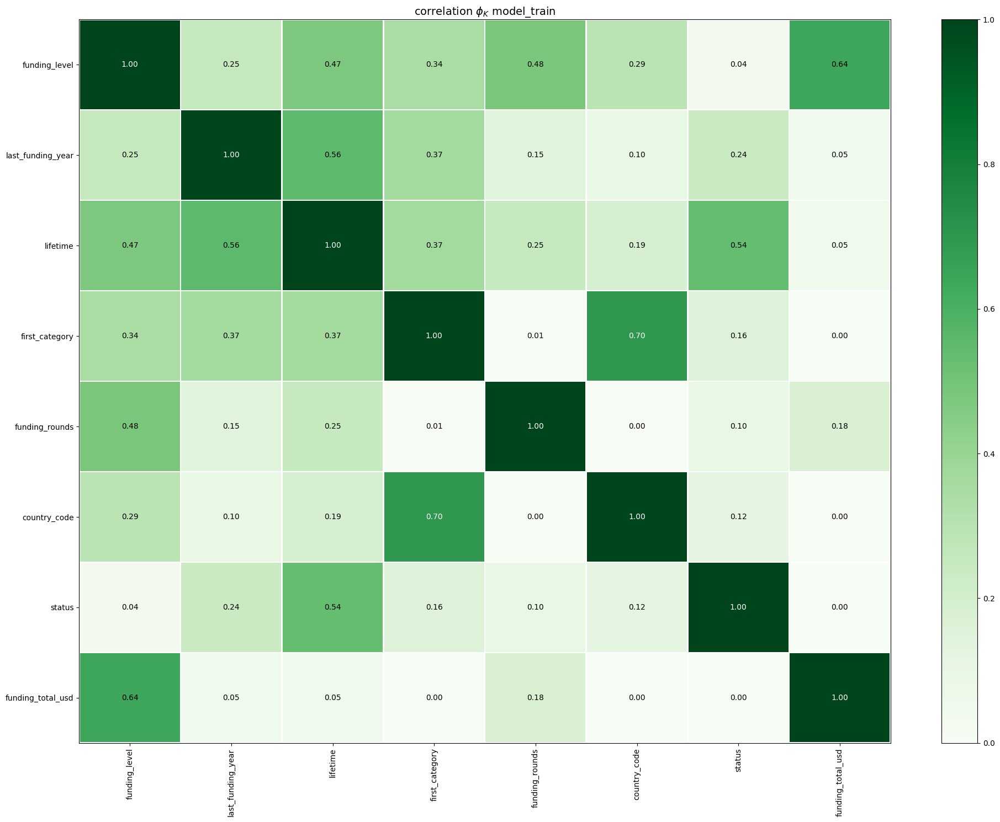

In [347]:
interval_cols_train = model_train.select_dtypes(include=['number']).columns.tolist()

phik_overview_train = model_train.phik_matrix(interval_cols=interval_cols_train)

plot_correlation_matrix(
    phik_overview_train.values,
    x_labels=phik_overview_train.columns,
    y_labels=phik_overview_train.index,
    vmin=0, vmax=1, color_map='Greens',
    title=r'correlation $\phi_K$ model_train',
    figsize=(20, 15)
) 
# рисуем матрицу корреляции для model_train, чтобы проверить, есть зависимость у нового признака, и нет ли мультиколлинеарности

Новый уровень составляет 0.04. Уже лучше. Уберем funding_total_usd из данных для обучения.

In [348]:
model_train = model_train.drop('funding_total_usd', axis=1)
model_test = model_test.drop('funding_total_usd', axis=1)

In [349]:
model_train.head(2)

,status,country_code,funding_rounds,first_category,lifetime,last_funding_year,funding_level
0,operating,CHE,2,Online Reservations,2998,2014,Низкий
1,operating,USA,4,Manufacturing,4748,2014,Высокий


In [350]:
model_test.head(2)

,country_code,funding_rounds,lifetime,first_category,last_funding_year,funding_level
0,NIC,1,3501,Clean Technology,2009,Средний
1,USA,1,2717,Hospitality,2010,None


In [351]:
print('Размер тренировочой выборки model_train:', model_train.shape)
print('Размер целевой выборки model_test:', model_test.shape)

Размер тренировочой выборки model_train: (52515, 7)
Размер целевой выборки model_test: (13125, 6)


In [352]:
print('Явных дубликатов в тренировочной выборке после удаления признаков:', model_train.duplicated().sum())
# проверяем, появились ли одинаковые строки в тренировочной выборке

Явных дубликатов в тренировочной выборке после удаления признаков: 2620


In [353]:
model_train = model_train.drop_duplicates()
model_train.duplicated().sum()
# убираем дубликаты и снова проверяем

0

In [354]:
print('Размер тренировочой выборки model_train после удаления дублей:', model_train.shape)

Размер тренировочой выборки model_train после удаления дублей: (49895, 7)


###  Разбивка тренировочного датасета на тренировочную и тестовую выборки.

In [355]:
X = model_train.drop('status', axis=1)
y = model_train['status']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=TEST_SIZE, random_state=RANDOM_STATE, stratify=y)
# разбиваем данные на тренировочную и тестовую выборки

In [356]:
print('Размер тренировочой выборки X_train с входными признаками:', X_train.shape)
print('Размер тренировочой выборки y_train с целевым признаком:', y_train.shape)
print('Размер тестовой выборки X_test с входными признаками:', X_test.shape)
print('Размер тестовой выборки y_test с целевым признаком:', y_test.shape)

Размер тренировочой выборки X_train с входными признаками: (37421, 6)
Размер тренировочой выборки y_train с целевым признаком: (37421,)
Размер тестовой выборки X_test с входными признаками: (12474, 6)
Размер тестовой выборки y_test с целевым признаком: (12474,)


##  Подготовка пайплайна.

###  Пайплайн для обработки пропусков.

In [357]:
model_train.isna().sum()
#смотрим, в каких признаках итогового датасета для обучения есть пропуски

status                  0
country_code         5396
funding_rounds          0
first_category       2333
lifetime                0
last_funding_year       0
funding_level        9770
dtype: int64

В рамках подготовки пайплайна для модели мы заполним пропуски при помощи SimpleImputer. Все признаки с пропусками являются категориальными. Будем использовать самое часто встречаемое значение для заполнения этих данных.

In [358]:
imputer_pipe = Pipeline(
    [
        (
            'simpleImputer',
            SimpleImputer(missing_values=np.nan, strategy='most_frequent')
        )
    ]
)
# создаем пайплайн для замены пропущенных значений

###  Пайплайн для кодирования и масштабированя.

In [359]:
num_columns = X_train.select_dtypes(include=['number']).columns.tolist()
num_columns
# определяем список количественных признаков

['funding_rounds', 'lifetime', 'last_funding_year']

In [360]:
X_train.select_dtypes(exclude=['number']).columns.tolist()
#смотрим на список категориальных признаков

['country_code', 'first_category', 'funding_level']

In [361]:
ohe_columns = ['country_code', 'first_category']
ord_columns = ['funding_level']
# определяем списки признаков под разные методы кодирования

In [362]:
ohe_pipe = Pipeline(
    [
        (
            'simpleImputer_ohe', 
            imputer_pipe
        ),
        (
            'ohe', 
            OneHotEncoder(drop='first', handle_unknown='ignore', sparse_output=False)
        )
    ]
)
# создаем пайплайн для подготовки признаков из списка ohe_columns: заполнение пропусков и OHE-кодирование

In [363]:
ord_pipe = Pipeline(
    [
        (
            'simpleImputer_before_ord', 
            imputer_pipe
        ),
        (
            'ord',
            OrdinalEncoder(
                categories=[
                    ['Низкий', 'Средний', 'Выше среднего', 'Высокий', 'Выдающийся']
                ], 
                handle_unknown='use_encoded_value',
                unknown_value=np.nan
            )
        ),
        (
            'simpleImputer_after_ord', 
            imputer_pipe
        )
    ]
)
# cоздаем пайплайн для подготовки признаков из списка ord_columns: заполнение пропусков и Ordinal-кодирование

In [364]:
data_preprocessor = ColumnTransformer(
    [
        ('ohe', ohe_pipe, ohe_columns),
        ('ord', ord_pipe, ord_columns),
        ('num', StandardScaler(), num_columns)
    ], 
    remainder =  'passthrough'
)
# создаем общий пайплайн для подготовки данных

In [365]:
label_encoder = LabelEncoder()
y_train = label_encoder.fit_transform(y_train)
y_test = label_encoder.transform(y_test)
# кодируем целевой признак

In [366]:
label_encoder.classes_
# проверяем, как закодировался целевой признак

array(['closed', 'operating'], dtype=object)

In [367]:
pred_classes = [0, 1]
print(label_encoder.inverse_transform(pred_classes))

['closed' 'operating']


## Обучение моделей для предсказания деятельности стартапов.

###  Пайплайн для обучения модели. Подбор гиперпараметров.

In [368]:
pipe_final= Pipeline([
    ('preprocessor', data_preprocessor),
    ('models', DecisionTreeClassifier(random_state=RANDOM_STATE))
]) 
# создаем итоговый пайплайн: подготовка данных и модель

In [369]:
param_grid = [
    {
        'models': [KNeighborsClassifier()],
        'models__n_neighbors': range(1, 5),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']   
    },
    {
        'models': [DecisionTreeClassifier(random_state=RANDOM_STATE)],
        'models__max_depth': range(2, 10),
        'models__min_samples_split': range(1, 6),
        'models__min_samples_leaf': range(2, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    },
    {
        'models': [SVC(random_state=RANDOM_STATE, probability=True)],
        'models__kernel': ['rbf', 'linear', 'poly'],
        'models__degree': range(1, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  

    },
    {
        'models': [LogisticRegression(random_state=RANDOM_STATE, solver='saga', penalty='elasticnet', l1_ratio=0.5)],
        'models__C': range(1, 6),
        'preprocessor__num': [StandardScaler(), MinMaxScaler(), 'passthrough']  
    }
]
# задаем гиперпараметры для работы пайплайна - список моделей для обучения c их гиперпараметрами и методами масштабирования

###  Выбор лучшей модели.

Для оценки качества моделей будем использовать метрику ROC-AUC.

In [370]:
randomized_search = RandomizedSearchCV(
    pipe_final, 
    param_grid, 
    cv=5,
    scoring='roc_auc',
    random_state=RANDOM_STATE,
    n_jobs=-1
)
# задаем параметры подбора лучшей модели

randomized_search.fit(X_train, y_train)
# обучаем модели на данных тренировочной выборки

print('Лучшая модель и её параметры:\n\n', randomized_search.best_estimator_)
print ('Метрика лучшей модели по кросс-валидации:', round(randomized_search.best_score_, 4))

Лучшая модель и её параметры:

 Pipeline(steps=[('preprocessor',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('ohe',
                                                  Pipeline(steps=[('simpleImputer_ohe',
                                                                   Pipeline(steps=[('simpleImputer',
                                                                                    SimpleImputer(strategy='most_frequent'))])),
                                                                  ('ohe',
                                                                   OneHotEncoder(drop='first',
                                                                                 handle_unknown='ignore',
                                                                                 sparse_output=False))]),
                                                  ['country_code',
                                                   '

In [371]:
y_pred = randomized_search.best_estimator_.predict(X_test)
y_proba = randomized_search.best_estimator_.predict_proba(X_test)[:, 1]
print(f'Метрика ROC-AUC на тестовой выборке: {round(roc_auc_score(y_test, y_proba),4)}')

Метрика ROC-AUC на тестовой выборке: 0.9332


In [372]:
result = pd.DataFrame(randomized_search.cv_results_)
display(result.sort_values('rank_test_score').head(10))
# смотрим на этапы вычислений

,mean_fit_time,std_fit_time,mean_score_time,std_score_time,param_preprocessor__num,param_models__C,param_models,param_models__min_samples_split,param_models__min_samples_leaf,param_models__max_depth,param_models__kernel,param_models__degree,params,split0_test_score,split1_test_score,split2_test_score,split3_test_score,split4_test_score,mean_test_score,std_test_score,rank_test_score
9,5.02,0.20,0.19,0.04,MinMaxScaler(),NaN,DecisionTreeClassifier(random_state=42),2.00,5.00,7.00,NaN,NaN,"{'preprocessor__num': MinMaxScaler(), 'models__min_samples_split': 2, 'models__min_samples_leaf': 5, 'models__max_depth': 7, 'models': DecisionTreeClassifier(random_state=42)}",0.93,0.94,0.94,0.94,0.93,0.93,0.00,1
5,5.42,0.10,0.25,0.01,StandardScaler(),NaN,DecisionTreeClassifier(random_state=42),2.00,5.00,7.00,NaN,NaN,"{'preprocessor__num': StandardScaler(), 'models__min_samples_split': 2, 'models__min_samples_leaf': 5, 'models__max_depth': 7, 'models': DecisionTreeClassifier(random_state=42)}",0.93,0.94,0.94,0.94,0.93,0.93,0.00,2
0,62.65,0.48,0.13,0.01,MinMaxScaler(),4.00,"LogisticRegression(l1_ratio=0.5, penalty='elasticnet', random_state=42,\n solver='saga')",NaN,NaN,NaN,NaN,NaN,"{'preprocessor__num': MinMaxScaler(), 'models__C': 4, 'models': LogisticRegression(l1_ratio=0.5, penalty='elasticnet', random_state=42, solver='saga')}",0.92,0.93,0.93,0.94,0.94,0.93,0.00,3
6,965.61,12.91,20.01,1.25,StandardScaler(),NaN,"SVC(probability=True, random_state=42)",NaN,NaN,NaN,linear,1.00,"{'preprocessor__num': StandardScaler(), 'models__kernel': 'linear', 'models__degree': 1, 'models': SVC(probability=True, random_state=42)}",0.93,0.93,0.92,0.93,0.94,0.93,0.00,4
4,4.99,0.08,0.26,0.01,passthrough,NaN,DecisionTreeClassifier(random_state=42),2.00,3.00,6.00,NaN,NaN,"{'preprocessor__num': 'passthrough', 'models__min_samples_split': 2, 'models__min_samples_leaf': 3, 'models__max_depth': 6, 'models': DecisionTreeClassifier(random_state=42)}",0.92,0.94,0.93,0.93,0.92,0.93,0.01,5
2,6.64,0.05,0.23,0.01,passthrough,NaN,DecisionTreeClassifier(random_state=42),3.00,2.00,4.00,NaN,NaN,"{'preprocessor__num': 'passthrough', 'models__min_samples_split': 3, 'models__min_samples_leaf': 2, 'models__max_depth': 4, 'models': DecisionTreeClassifier(random_state=42)}",0.91,0.91,0.90,0.91,0.90,0.90,0.00,6
1,6.08,0.05,0.27,0.01,StandardScaler(),NaN,DecisionTreeClassifier(random_state=42),4.00,2.00,3.00,NaN,NaN,"{'preprocessor__num': StandardScaler(), 'models__min_samples_split': 4, 'models__min_samples_leaf': 2, 'models__max_depth': 3, 'models': DecisionTreeClassifier(random_state=42)}",0.89,0.89,0.88,0.89,0.88,0.89,0.00,7
3,3.68,1.09,0.25,0.01,MinMaxScaler(),NaN,DecisionTreeClassifier(random_state=42),3.00,2.00,3.00,NaN,NaN,"{'preprocessor__num': MinMaxScaler(), 'models__min_samples_split': 3, 'models__min_samples_leaf': 2, 'models__max_depth': 3, 'models': DecisionTreeClassifier(random_state=42)}",0.89,0.89,0.88,0.89,0.88,0.89,0.00,7
8,3.14,0.06,0.27,0.01,MinMaxScaler(),NaN,DecisionTreeClassifier(random_state=42),4.00,2.00,3.00,NaN,NaN,"{'preprocessor__num': MinMaxScaler(), 'models__min_samples_split': 4, 'models__min_samples_leaf': 2, 'models__max_depth': 3, 'models': DecisionTreeClassifier(random_state=42)}",0.89,0.89,0.88,0.89,0.88,0.89,0.00,7
7,0.60,0.01,0.00,0.00,passthrough,NaN,DecisionTreeClassifier(random_state=42),1.00,5.00,9.00,NaN,NaN,"{'preprocessor__num': 'passthrough', 'models__min_samples_split': 1, 'models__min_samples_leaf': 5, 'models__max_depth': 9, 'models': DecisionTreeClassifier(random_state=42)}",NaN,NaN,NaN,NaN,NaN,NaN,NaN,10


###  Предсказания в целевом датасете startup_test.

In [373]:
model_pred = randomized_search.best_estimator_.predict(model_test)
model_pred
# делаем предсказания

array([1, 1, 1, ..., 1, 1, 1])

In [374]:
print(len(model_pred))
print(len(model_test))
print(len(startup_test))
# смотрим на соответствие по количеству строк

13125
13125
13125


In [375]:
startup_test['status'] = model_pred
# добавляем предсказания к датасету startup_test

In [376]:
startup_test.head()

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime,first_category,first_funding_year,last_funding_year,status
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501,Clean Technology,2009,2009,1
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717,Hospitality,2010,2010,1
2,COINPLUS,Finance,"428,257.00",LUX,3,Esch-sur-alzette,Esch-sur-alzette,2,2014-05-15,2014-09-18,1295,Finance,2014,2014,1
3,Imagine Communications,Software|Video|Video Streaming,"34,700,000.00",USA,CA,San Diego,San Diego,4,2005-01-01,2010-04-20,4748,Software,2005,2010,1
4,DNA13,Software,"4,530,000.00",CAN,ON,Ottawa,Ottawa,1,2007-05-08,2007-05-08,6209,Software,2007,2007,1


In [377]:
startup_test['status'] = startup_test['status'].apply(lambda x: 'closed' if x == 0 else 'operating')
# приводим закодированные предсказания к исходным вариантам closed/operating

In [378]:
startup_test.head()

,name,category_list,funding_total_usd,country_code,state_code,region,city,funding_rounds,first_funding_at,last_funding_at,lifetime,first_category,first_funding_year,last_funding_year,status
0,Crystalsol,Clean Technology,"2,819,200.00",NIC,17,NaN,NaN,1,2009-07-01,2009-07-01,3501,Clean Technology,2009,2009,operating
1,JBI Fish & Wings,Hospitality,NaN,USA,TN,TN - Other,Humboldt,1,2010-07-28,2010-07-28,2717,Hospitality,2010,2010,operating
2,COINPLUS,Finance,"428,257.00",LUX,3,Esch-sur-alzette,Esch-sur-alzette,2,2014-05-15,2014-09-18,1295,Finance,2014,2014,operating
3,Imagine Communications,Software|Video|Video Streaming,"34,700,000.00",USA,CA,San Diego,San Diego,4,2005-01-01,2010-04-20,4748,Software,2005,2010,operating
4,DNA13,Software,"4,530,000.00",CAN,ON,Ottawa,Ottawa,1,2007-05-08,2007-05-08,6209,Software,2007,2007,operating


In [379]:
kaggle_startups = startup_test[['name', 'status']]
kaggle_startups.head()
# готовим таблицу для kaggle

,name,status
0,Crystalsol,operating
1,JBI Fish & Wings,operating
2,COINPLUS,operating
3,Imagine Communications,operating
4,DNA13,operating


In [380]:
#kaggle_startups.to_csv(r"C:/Projects/kaggle_startups.csv", index=False, sep=";")
# выгружаем в локальный файл

### Анализ важности признаков для выбранной модели.

In [381]:
best_model = randomized_search.best_estimator_.named_steps['models']
# фиксируем лучшую модель с параметрами в переменную для анализа признаков
preprocessor = randomized_search.best_estimator_.named_steps['preprocessor']
X_train_pr = preprocessor.transform(X_train)
X_test_pr = preprocessor.transform(X_test)
# кодируем и масштабируем признаки
feature_names = randomized_search.best_estimator_.named_steps['preprocessor'].get_feature_names_out()
#определяем список признаков для визуализации

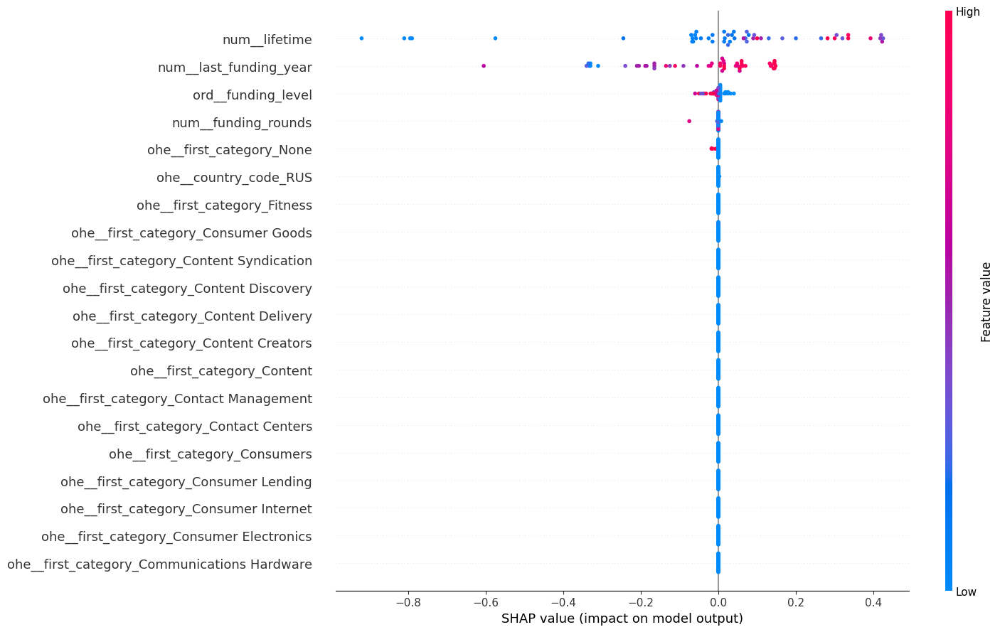

In [382]:
explainer = shap.Explainer(best_model.predict, X_test_pr)
shap_values = explainer(X_test_pr[:50])
# рассчитываем значения Шепли
shap.summary_plot(shap_values, feature_names=feature_names, plot_size = (15,9))
# строим диаграмму вклада признаков в предсказание модели

Анализ показывает, что наибольшее влияние на работу модели оказывают признаки:
- lifetime - жизненный цикл компании в днях.
- last_funding_year - год последнего финансирования.
- funding_level - уровень финансирования.

Чем дольше компания работает, тем меньше вероятность, что она закроется. И наоборот, компании с коротким жизненным циклом более склонны к закрытию.
Похожим образом видится логика по времени последнего финансирования - если финансирование было недавно - компания с большей вероятностью будет работать, а если компанию финансировали давно - ее шансы понижаются. \
Интересно, что уровень финансирования показывает обратный эффект. Высокий уровень финансирования чаще приводит к закрытию.

### Вывод по работе модели для предсказания работы стартапов.

На данном этапе работы мы подготовили датасеты model_train и model_test для обучения. Сначала мы убрвли из исходных датасетов признаки, которые мы решили исключить из модели: 'name', 'category_list', 'state_code', 'region', 'city', 'founded_at', 'first_funding_at', 'last_funding_at', 'closed_at' и 'first_funding_year'. После этого мы преобразовали параметр funding_total_usd в категориальный признак funding_level, который показывает связь с целевым в отличие от исходного.

Затем мы создали пайплайны для заполнения пропусков и кодирования категориальных признаков и пайплайн для обучения 4 моделей: KNeighborsClassifier(), DecisionTreeClassifier(), SVC() и LogisticRegression(). Для каждой модели в пайплайне мы задали набор гиперпараметров.
В качестве метрики оценки качества модели была выбрана ROC-AUC. При помощи метода RandomizedSearchCV мы выбрали лучшую модель для решения поставленной задачи.
Этой моделью оказалась DecisionTreeClassifier с гиперпараметрами: max_depth=7, min_samples_leaf=5.

Метрика по кросс-валидации данных показала значение 0.9347. На тестовых данных она составила 0.9332.
Самыми важными признаками для выбранной модели оказались lifetime, last_funding_year и funding_level.

## Итоговые выводы.

В рамках данной работы мы провели анализ стартапов с 1970 по 2018 год с целью выявить факторы, влияющие на закрытие стартапов.

На **первом и втором этапах** проекта мы проанализировали исходные данные. Загружены две таблицы с данными - тренировочная и тестовая выборки по стартапам. Мы выяснили, что набор признаков в тренировочной и тестовой выборке отличается: в датасете startup_data данные о времени работы компании представлены в виде двух признаков в формате дат founded_at и closed_at (дата основания и дата закрытия соответственно). А в тренировочной выборке эта характеристика представлена в виде числа lifetime. Мы привели данные по времени работы компаний в startup_data к формату lifetime.

В датасете startup_data 52516 записей. Во многих столбцах есть пропуски, больше всего их closed_at. Тип данных в ячейках тоже не совсем корректен (даты представлены в виде простой строки). Числовые характеристики funding_total_usd и funding_rounds имеют аномально высокие значения. В датасете startup_test 13125 записей. Тут также большое количество пропусков в данных, неверный тип данных в датах. Числовые характеристики funding_total_usd, funding_rounds и lifetime также имеют аномально высокие значения.

Пропуски в данных мы заполним в пайплайне на этапе разработки модели при помощи SimpleImputer. Анализ дубликатов не выявил явных дублей в данных, но показал огромное количество вариантов значений по географическим параметрам, а также в списке категорий компаний. 

Чтобы эти признаки использовать в работе моделей - на финальном шаге этапа мы создали новый признак - с первой категорией компании из списка firts_category, а также выделили год из дат финансирования.

На **третьем этапе** проекта мы провели исследовательский анализ количественных и категориальных признаков датасета, провели корреляционный анализ данных.

Анализ показал, что большая часть стартапов все еще успешно функционирует. Мы видим, что средние и медианные значения сумм финансирования несколько ниже у закрытых компаний, что логично (в более успешные компании вкладывают больше средств). А вот число раундов финансирования не сильно отличается. Максимальное количество таких раундов больше у действующих компаний, но вот средние и медианные значения не сильно отличаются от закрытых компаний (медиана вообще одинаково и составляет 1 раунд). Время жизни в днях у закрытых компаний - ожидаемо ниже чем у действующих. Минимальное значение в 740 дней у действующих компаний позволяет предположить, что жизненный цикл более двух лет - повышает шанс компании стать успешной. \
Анализ категориальных значений сильно затруднен тем, что признаки имеют очень большое количество уникальных значений. Мы разделили список признаков на характеристики с небольшим набором значений и с большим набором значений. В список с небольшим набором категорий вошли: 'status', 'first_funding_year', 'last_funding_year'. В список с большим набором категорий вошли: 'country_code', 'state_code', 'region', 'city', 'first_category' По первому списку мы проанализировали весь набор данных. По статусу мы видим, что примерно 9% компаний из тренировочного датасета закрылись. Целевой признак не сбалансирован. По годам финансирования мы видим, что у нас есть значительный перекос в сторону последних лет. По большему количеству компаний последнее финансирование было в 2014 и 2015 годах, а чем дальше в прошлое, тем меньше таких компаний. \
По остальным категориальным признакам мы свели данные в группы и посмотрели на распределение этих групп по целевому признаку статуса. А также посмотрели, какую долю занимают в этих группах закрывшиеся компании. При этом мы отбросили группы, в которые вошло меньше 10 компаний, как слишком малозначящие уникальные компании. При анализе страны компаний, мы видим, что наибольшая доля закрытых компаний - в России (35%) и Перу (26%). В абсолютных величинах лидирует США, но в датасетах большую часть компаний составляют именно американские, и доля закрытых по ним составляет всего 8%. Наибольшая доля закрытых компаний по признаку state_code - в 48 и 66. По региону, как и по стране - в лидерах Россия - 33% закрытых по России в целом, и по 31% приходится на Москву и Санкт-Петербург. По городам самые неудачные варианты: Lucerne Valley, Makati и Moscow. Анализ первой категории бизнеса показал, что самые рисковые категории: Identity (31%), Innovation Management (30%) и Journalism (29%). \
На финальном шаге этапа был проведен корреляционный анализ датасетов. Предварительно мы исключили из анализа категориальные признаки, имеющие слишком большое количество уникальных значений, чтобы принести пользу в работу модели, а также исключили отсутствующие признаки тестового датасета.
Мы видим, что наибольшая корреляция у целевого признака status с признаком lifetime (0.54). С остальными признаками связь довольно слабая. С признаком funding_total_usd коэффициент равен нулю. Также мы обнаружили мультиколлинеарность между признаками last_funding_year и first_funding_year.

На **четвертом этапе** мы готовили исходные данные для обучения модели.

Во время корреляционного анализа мы пришли к выводу, что большое количество признаков с уникальными комбинациями не привнесет полезного в работу модели. Поэтому на данном этапе мы убрали лишние признаки и добавили новые. Из признаков географической привязки мы оставили страну country_code. Также мы убрали category_list, оставив для модели только выведенный ранее first_category, и убрали отсутствующие в тестовой выборке founded_at и closed_at, и даты first_funding_at/last_funding_at, вместо которых мы ввели last_funding_year и first_funding_year. Поскольку корреляционный анализ показал мультиколлинеарность last_funding_year и first_funding_year - оставили в признаках только last_funding_year.

На **пятом этапе** мы готовили пайплайны для заполнения пропусков и масштабирования и кодирования данных.

На **шестом этапе** мы готовили и обучали модели по предсказанию закрытия стартапов.

Мы создали пайплайны для обучения 4 моделей: KNeighborsClassifier(), DecisionTreeClassifier(), SVC() и LogisticRegression(). Для каждой модели в пайплайне мы задали набор гиперпараметров.
В качестве метрики оценки качества модели была выбрана ROC-AUC. При помощи метода RandomizedSearchCV мы выбрали лучшую модель для решения поставленной задачи.
Этой моделью оказалась **DecisionTreeClassifier** с гиперпараметрами: max_depth=7, min_samples_leaf=5. Метрика по кросс-валидации данных показала значение 0.9347. На тестовых данных она составила 0.9332.

Самыми важными признаками для выбранной модели оказались lifetime, last_funding_year и funding_level.

По итогам исследования можно вывести следующие рекомендации для стартапов, чтобы избежать закрытия:
1. Постараться вести бизнес дольше 2 лет. Ключевым фактором для закрытия компаний, согласно нашему анализу, является время жизненного цикла компании.
2. Поддерживать стабильное и постоянное финансирование. При долгом отсутствии финансирования риск закрытия уывеличивается.
3. Избыточное финансирование, как и недостаточное - тоже приводит к повышенным рискам закрытия. Лучше поддерживать стабильный, но не очень высокий уровень финансовых вложений.
4. Несмотря на то, что географическая привязка не оказывает сильного влияния на успешность компании, нельзя не отметить, что по имеющимся данным, риск открытия такого бизнеса в России в анализируемом периоде был довольно высок. И признак принадлежности компании к countru_code=RUS имеет довольно высокое влияние в модели. Хочется верить, что в настоящее время такой риск существенно снижен.